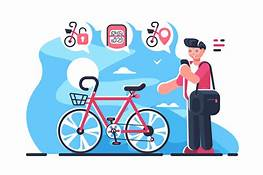

# PRCP-1018-Bike Rental

# Business case

A bike-sharing system is a service in which bikes are made available for shared use to individuals on a short term basis for a price or free.


Capital Bikeshare system, Washington D.C., USA, a US bike-sharing provider, wants to meet people's needs and plan ahead to stand out from other service providers and generate huge profits.


For this we need to model Shared bike demand with available arguments.

# Importing some basic libraries and reading the dataset

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn import metrics
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

## Load Data

### Let us now load the data and story it as a pandas dataframe. Here we are displaying the first 5 rows of our dataframe.

In [2]:
data_day=pd.read_csv("day.csv")
data_hour=pd.read_csv("hour.csv")

In [3]:
data_day.head()

,instant,dteday,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,6,0,2,0.344167,0.363625,0.805833,0.160446,331,654,985
1,2,2011-01-02,1,0,1,0,0,0,2,0.363478,0.353739,0.696087,0.248539,131,670,801
2,3,2011-01-03,1,0,1,0,1,1,1,0.196364,0.189405,0.437273,0.248309,120,1229,1349
3,4,2011-01-04,1,0,1,0,2,1,1,0.200000,0.212122,0.590435,0.160296,108,1454,1562
4,5,2011-01-05,1,0,1,0,3,1,1,0.226957,0.229270,0.436957,0.186900,82,1518,1600


In [4]:
data_hour.head()

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0,3,13,16
1,2,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0,8,32,40
2,3,2011-01-01,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0,5,27,32
3,4,2011-01-01,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0,3,10,13
4,5,2011-01-01,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0,0,1,1


### To get number of rows and columns of the dataset

In [5]:
print(data_day.shape)
print(data_hour.shape)

(731, 16)
(17379, 17)


In [6]:
print(f'\033[1;31m  \033[1m Given day based dataset contains {data_day.shape[0]} rows and {data_day.shape[1]} columns.')
print(f'\033[1;31m  \033[1m Given hour based dataset contains {data_hour.shape[0]} rows and {data_hour.shape[1]} columns.')


   Given day based dataset contains 731 rows and 16 columns.
   Given hour based dataset contains 17379 rows and 17 columns.


Hour based dataset contain more number of rows and one extra column which is hr (hour) column.

In [7]:
data_day.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 731 entries, 0 to 730
Data columns (total 16 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   instant     731 non-null    int64  
 1   dteday      731 non-null    object 
 2   season      731 non-null    int64  
 3   yr          731 non-null    int64  
 4   mnth        731 non-null    int64  
 5   holiday     731 non-null    int64  
 6   weekday     731 non-null    int64  
 7   workingday  731 non-null    int64  
 8   weathersit  731 non-null    int64  
 9   temp        731 non-null    float64
 10  atemp       731 non-null    float64
 11  hum         731 non-null    float64
 12  windspeed   731 non-null    float64
 13  casual      731 non-null    int64  
 14  registered  731 non-null    int64  
 15  cnt         731 non-null    int64  
dtypes: float64(4), int64(11), object(1)
memory usage: 91.5+ KB


In [8]:
data_hour.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17379 entries, 0 to 17378
Data columns (total 17 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   instant     17379 non-null  int64  
 1   dteday      17379 non-null  object 
 2   season      17379 non-null  int64  
 3   yr          17379 non-null  int64  
 4   mnth        17379 non-null  int64  
 5   hr          17379 non-null  int64  
 6   holiday     17379 non-null  int64  
 7   weekday     17379 non-null  int64  
 8   workingday  17379 non-null  int64  
 9   weathersit  17379 non-null  int64  
 10  temp        17379 non-null  float64
 11  atemp       17379 non-null  float64
 12  hum         17379 non-null  float64
 13  windspeed   17379 non-null  float64
 14  casual      17379 non-null  int64  
 15  registered  17379 non-null  int64  
 16  cnt         17379 non-null  int64  
dtypes: float64(4), int64(12), object(1)
memory usage: 2.3+ MB


After analyzing both data dataset we are going to perform all our analysis on hour_based_dataset . which provide more insights about dataset. 

### Rename the columns for better understanding of variables

In [9]:
data_hour.rename(columns={'instant':'rec_id','dteday':'date','yr':'year','mnth':'month','hr':'hour','weathersit':'weather_condition',
                       'atemp':'temp_feel_like','hum':'humidity','casual':'unregistered','cnt':'total_count'},inplace=True)

In [10]:
data_hour.head()

,rec_id,date,season,year,month,hour,holiday,weekday,workingday,weather_condition,temp,temp_feel_like,humidity,windspeed,unregistered,registered,total_count
0,1,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0,3,13,16
1,2,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0,8,32,40
2,3,2011-01-01,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0,5,27,32
3,4,2011-01-01,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0,3,10,13
4,5,2011-01-01,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0,0,1,1


In [11]:
data_hour.sample(5)

,rec_id,date,season,year,month,hour,holiday,weekday,workingday,weather_condition,temp,temp_feel_like,humidity,windspeed,unregistered,registered,total_count
72,73,2011-01-04,1,0,1,4,0,2,1,1,0.14,0.1818,0.63,0.0896,0,2,2
12723,12724,2012-06-19,2,1,6,8,0,2,1,2,0.60,0.5758,0.78,0.1642,40,633,673
768,769,2011-02-04,1,0,2,11,0,5,1,1,0.22,0.2273,0.51,0.1642,3,61,64
5359,5360,2011-08-16,3,0,8,5,0,2,1,1,0.62,0.5909,0.73,0.2836,1,29,30
6340,6341,2011-09-26,4,0,9,18,0,1,1,1,0.66,0.6061,0.83,0.1045,63,490,553


In [12]:
data_hour.sample(5)

,rec_id,date,season,year,month,hour,holiday,weekday,workingday,weather_condition,temp,temp_feel_like,humidity,windspeed,unregistered,registered,total_count
5749,5750,2011-09-02,3,0,9,0,0,5,1,1,0.64,0.6061,0.65,0.1940,6,58,64
16154,16155,2012-11-10,4,1,11,20,0,6,0,1,0.44,0.4394,0.54,0.0000,39,153,192
6808,6809,2011-10-16,4,0,10,6,0,0,0,1,0.38,0.3939,0.66,0.1642,3,7,10
7270,7271,2011-11-04,4,0,11,13,0,5,1,1,0.44,0.4394,0.51,0.4179,33,161,194
1421,1422,2011-03-04,1,0,3,12,0,5,1,1,0.32,0.3030,0.43,0.1642,10,87,97


### Now let us analyse the statistical description of our data.

In [13]:
data_hour.describe()

,rec_id,season,year,month,hour,holiday,weekday,workingday,weather_condition,temp,temp_feel_like,humidity,windspeed,unregistered,registered,total_count
count,17379.0000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000
mean,8690.0000,2.501640,0.502561,6.537775,11.546752,0.028770,3.003683,0.682721,1.425283,0.496987,0.475775,0.627229,0.190098,35.676218,153.786869,189.463088
std,5017.0295,1.106918,0.500008,3.438776,6.914405,0.167165,2.005771,0.465431,0.639357,0.192556,0.171850,0.192930,0.122340,49.305030,151.357286,181.387599
min,1.0000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.020000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,4345.5000,2.000000,0.000000,4.000000,6.000000,0.000000,1.000000,0.000000,1.000000,0.340000,0.333300,0.480000,0.104500,4.000000,34.000000,40.000000
50%,8690.0000,3.000000,1.000000,7.000000,12.000000,0.000000,3.000000,1.000000,1.000000,0.500000,0.484800,0.630000,0.194000,17.000000,115.000000,142.000000
75%,13034.5000,3.000000,1.000000,10.000000,18.000000,0.000000,5.000000,1.000000,2.000000,0.660000,0.621200,0.780000,0.253700,48.000000,220.000000,281.000000
max,17379.0000,4.000000,1.000000,12.000000,23.000000,1.000000,6.000000,1.000000,4.000000,1.000000,1.000000,1.000000,0.850700,367.000000,886.000000,977.000000


### Information about columns of dataset

In [14]:
data_col_all=list(data_hour.columns)
data_col_float=list(data_hour.select_dtypes("float").columns)
data_col_int=list(data_hour.select_dtypes("integer").columns)
data_col_obj=list(data_hour.select_dtypes("object").columns)

### Information about columns of datatype float

In [15]:
print(data_hour[data_col_float].info())
print(f'\033[1;31m  \033[1m Given dataset contains  {data_hour[data_col_float].shape[1]} float columns.')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17379 entries, 0 to 17378
Data columns (total 4 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   temp            17379 non-null  float64
 1   temp_feel_like  17379 non-null  float64
 2   humidity        17379 non-null  float64
 3   windspeed       17379 non-null  float64
dtypes: float64(4)
memory usage: 543.2 KB
None
   Given dataset contains  4 float columns.


### Key description\statistics of features of datatype float

In [16]:
data_hour.describe(include='float')

,temp,temp_feel_like,humidity,windspeed
count,17379.000000,17379.000000,17379.000000,17379.000000
mean,0.496987,0.475775,0.627229,0.190098
std,0.192556,0.171850,0.192930,0.122340
min,0.020000,0.000000,0.000000,0.000000
25%,0.340000,0.333300,0.480000,0.104500
50%,0.500000,0.484800,0.630000,0.194000
75%,0.660000,0.621200,0.780000,0.253700
max,1.000000,1.000000,1.000000,0.850700


### Information about columns of datatype integer

In [17]:
print(data_hour[data_col_int].info())
print(f'\033[1;31m  \033[1m Given dataset contains  {data_hour[data_col_int].shape[1]} integer columns.')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17379 entries, 0 to 17378
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype
---  ------             --------------  -----
 0   rec_id             17379 non-null  int64
 1   season             17379 non-null  int64
 2   year               17379 non-null  int64
 3   month              17379 non-null  int64
 4   hour               17379 non-null  int64
 5   holiday            17379 non-null  int64
 6   weekday            17379 non-null  int64
 7   workingday         17379 non-null  int64
 8   weather_condition  17379 non-null  int64
 9   unregistered       17379 non-null  int64
 10  registered         17379 non-null  int64
 11  total_count        17379 non-null  int64
dtypes: int64(12)
memory usage: 1.6 MB
None
   Given dataset contains  12 integer columns.


### Key description\statistics of features of datatype integer

In [18]:
data_hour.describe(include='int')

,rec_id,season,year,month,hour,holiday,weekday,workingday,weather_condition,unregistered,registered,total_count
count,17379.0000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000
mean,8690.0000,2.501640,0.502561,6.537775,11.546752,0.028770,3.003683,0.682721,1.425283,35.676218,153.786869,189.463088
std,5017.0295,1.106918,0.500008,3.438776,6.914405,0.167165,2.005771,0.465431,0.639357,49.305030,151.357286,181.387599
min,1.0000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000
25%,4345.5000,2.000000,0.000000,4.000000,6.000000,0.000000,1.000000,0.000000,1.000000,4.000000,34.000000,40.000000
50%,8690.0000,3.000000,1.000000,7.000000,12.000000,0.000000,3.000000,1.000000,1.000000,17.000000,115.000000,142.000000
75%,13034.5000,3.000000,1.000000,10.000000,18.000000,0.000000,5.000000,1.000000,2.000000,48.000000,220.000000,281.000000
max,17379.0000,4.000000,1.000000,12.000000,23.000000,1.000000,6.000000,1.000000,4.000000,367.000000,886.000000,977.000000


### Information about columns of datatype object

In [19]:
print(data_hour[data_col_obj].info())
print(f'\033[1;31m  \033[1m Given dataset contains  {data_hour[data_col_obj].shape[1]} categorical columns.')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17379 entries, 0 to 17378
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   date    17379 non-null  object
dtypes: object(1)
memory usage: 135.9+ KB
None
   Given dataset contains  1 categorical columns.


### Key description\statistics of columns of datatype object

In [20]:
data_hour.describe(include='object')

,date
count,17379
unique,731
top,2011-01-01
freq,24


### Check for duplicate data

In [21]:
print("\033[1;31m  \033[1m Total no of duplicate value :-",data_hour.duplicated().sum())

   Total no of duplicate value :- 0


In [22]:
print('\033[1;31m  \033[1m unregistered + registered = total_count ? ', ~(data_hour.unregistered + data_hour.registered - data_hour['total_count']).any())

   unregistered + registered = total_count ?  True


we can see here total_count is sum of unregistered(casual) + registered which leads to false prediction during model creation so will drop both column in features selection .

### To check all the null values from the dataset

In [23]:
data_hour.isnull().sum()

rec_id               0
date                 0
season               0
year                 0
month                0
hour                 0
holiday              0
weekday              0
workingday           0
weather_condition    0
temp                 0
temp_feel_like       0
humidity             0
windspeed            0
unregistered         0
registered           0
total_count          0
dtype: int64

In [24]:
null_data = data_hour.isna().sum().sort_values(ascending=False)
null_data = null_data.reset_index(drop = False)
null_data = null_data.rename(columns={"index": "Columns", 0:"Value"})
null_data['proportion'] = (null_data['Value']/len(data_hour))*100
null_data.head()

,Columns,Value,proportion
0,rec_id,0,0.0
1,weather_condition,0,0.0
2,registered,0,0.0
3,unregistered,0,0.0
4,windspeed,0,0.0


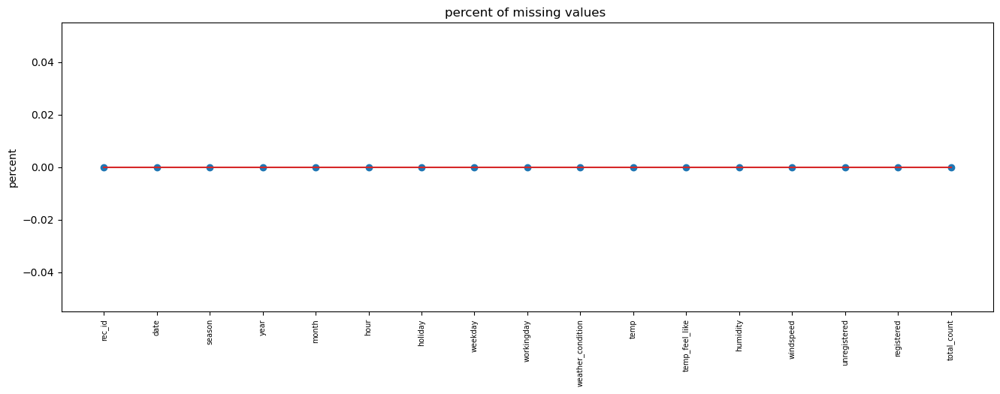

In [25]:
# Visualizing the missing values

missing=pd.DataFrame((data_hour.isnull().sum())*100/data_hour.shape[0]).reset_index()
plt.figure(figsize=(16,5))
ax=plt.stem(missing['index'],missing[0])
plt.xticks(rotation=90,fontsize=7)
plt.title('percent of missing values ')
plt.ylabel('percent')
plt.show()

Observations:
  - Dataset does not have null values. Hence, null value handling will not be done as a part of this assignment`</b> 
        

### Unique Columns

In [26]:
num_unique_col=data_hour.nunique()
print(num_unique_col)
print("\033[1;31m  \033[1m Total no of columns contain unique values :",len(num_unique_col))

rec_id               17379
date                   731
season                   4
year                     2
month                   12
hour                    24
holiday                  2
weekday                  7
workingday               2
weather_condition        4
temp                    50
temp_feel_like          65
humidity                89
windspeed               30
unregistered           322
registered             776
total_count            869
dtype: int64
   Total no of columns contain unique values : 17


In [27]:
unique_values=data_hour.apply(pd.Series.unique)
unique_values

rec_id               [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...
date                 [2011-01-01, 2011-01-02, 2011-01-03, 2011-01-0...
season                                                    [1, 2, 3, 4]
year                                                            [0, 1]
month                          [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
hour                 [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...
holiday                                                         [0, 1]
weekday                                          [6, 0, 1, 2, 3, 4, 5]
workingday                                                      [0, 1]
weather_condition                                         [1, 2, 3, 4]
temp                 [0.24, 0.22, 0.2, 0.32, 0.38, 0.36, 0.42, 0.46...
temp_feel_like       [0.2879, 0.2727, 0.2576, 0.3485, 0.3939, 0.333...
humidity             [0.81, 0.8, 0.75, 0.86, 0.76, 0.77, 0.72, 0.82...
windspeed            [0.0, 0.0896, 0.2537, 0.2836, 0.2985, 0.194, 0...
unregi

The uniqueness of features used in this data are:

    date : date

    season : 1:spring 2:summer 3:fall 4:winter

    yearr : year (0: 2011, 1:2012)

    month : month ( 1 to 12)

    holiday : weather day is holiday or not (0: No holiday , 1: holiday) )

    weekday : day of the week(0,1,2,3,4,5,6)

    workingday : if day is neither weekend nor holiday is 1, otherwise is 0.

    weather_condition : 1: Clear, Few clouds, Partly cloudy, Partly cloudy 2: Mist + Cloudy, Mist + Broken clouds, Mist + Few clouds, Mist 3: Light Snow, Light Rain + Thunderstorm + Scattered clouds, Light Rain + Scattered clouds 4: Heavy Rain + Ice Pallets + Thunderstorm + Mist, Snow + Fog

    temp : Normalized temperature in Celsius. The values are divided to 41 (max)

    temp_feel_like : Normalized feeling temperature in Celsius. The values are divided to 50 (max)

    humidity : Normalized humidity. The values are divided to 100 (max)

    windspeed: Normalized wind speed. The values are divided to 67 (max)

    unregistered: count of casual users

    registered: count of registered users

    total_count: count of total rental bikes including both casual and registered

## Exploratory Data Analysis

Let us remove some redundant features that wont be required for Data Analysis

In [28]:
# removing redundant columns
data_hour = data_hour.drop('rec_id', axis=1)
data_hour = data_hour.drop('holiday', axis=1)


#### Creating a deep copy of data_hour for exploratory data analysis


In [29]:
data_hour_copy=data_hour.copy(deep=True)

#### mapping the data according to provided datasheet

#### mapping the season

In [30]:
# Using season codes from provided data set
season_codes = {1:'spring',2:'summer',3:'fall',4:'winter'}
data_hour_copy['season'] = data_hour_copy['season'].map(season_codes)

In [31]:
data_hour_copy.season.value_counts()

fall      4496
summer    4409
spring    4242
winter    4232
Name: season, dtype: int64

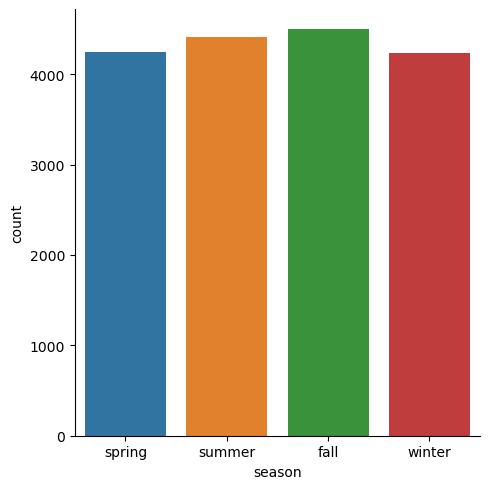

In [32]:
sns.catplot(x='season',data=data_hour_copy,kind='count')

<Axes: ylabel='season'>

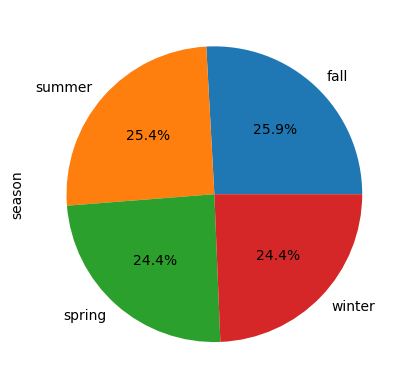

In [33]:
data_hour_copy['season'].value_counts().plot(kind = 'pie', autopct = '%1.1f%%')

#### mapping the weather_condition

In [34]:
weather_condition_codes = {1:'Clear',2:'Mist',3:'Light Snow',4:'Heavy Rain'}
data_hour_copy['weather_condition'] = data_hour_copy['weather_condition'].map(weather_condition_codes)

In [35]:
data_hour_copy.weather_condition.value_counts()

Clear         11413
Mist           4544
Light Snow     1419
Heavy Rain        3
Name: weather_condition, dtype: int64

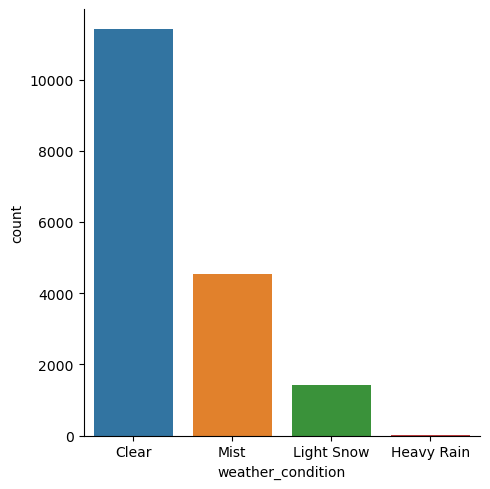

In [36]:
sns.catplot(x='weather_condition',data=data_hour_copy,kind='count')

<Axes: ylabel='weather_condition'>

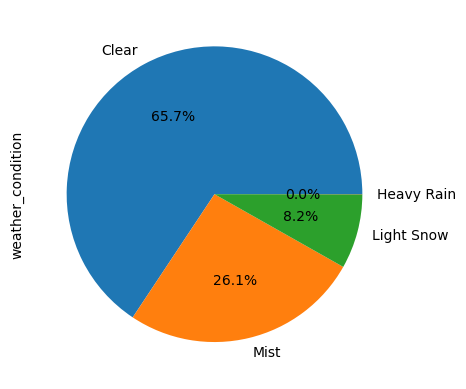

In [37]:
data_hour_copy['weather_condition'].value_counts().plot(kind = 'pie', autopct = '%1.1f%%')

#### mapping the workingday

In [38]:
workingday_codes = {1:'working_day',0:'holiday'}
data_hour_copy['workingday'] = data_hour_copy['workingday'].map(workingday_codes)

In [39]:
data_hour_copy.workingday.value_counts()

working_day    11865
holiday         5514
Name: workingday, dtype: int64

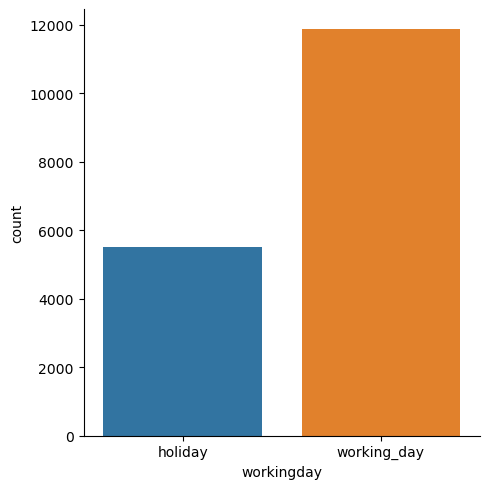

In [40]:
sns.catplot(x='workingday',data=data_hour_copy,kind='count')

<Axes: ylabel='workingday'>

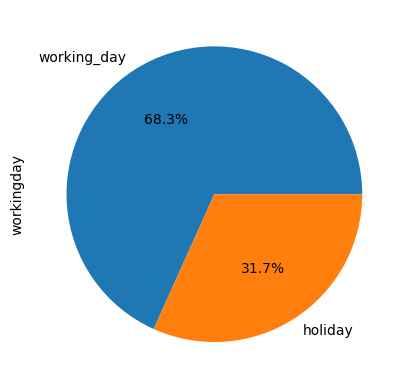

In [41]:
data_hour_copy['workingday'].value_counts().plot(kind = 'pie', autopct = '%1.1f%%')

#### mapping the month

In [42]:
month_codes = {1:'Jan',2:'Feb',3:'Mar',4:'Apr',5:'May',6:'June',7:'July',8:'Aug',9:'Sep',10:'Oct',11:'Nov',12:'Dec'}
data_hour_copy['month'] = data_hour_copy['month'].map(month_codes)

In [43]:
data_hour_copy['month'].value_counts()

May     1488
July    1488
Dec     1483
Aug     1475
Mar     1473
Oct     1451
June    1440
Apr     1437
Sep     1437
Nov     1437
Jan     1429
Feb     1341
Name: month, dtype: int64

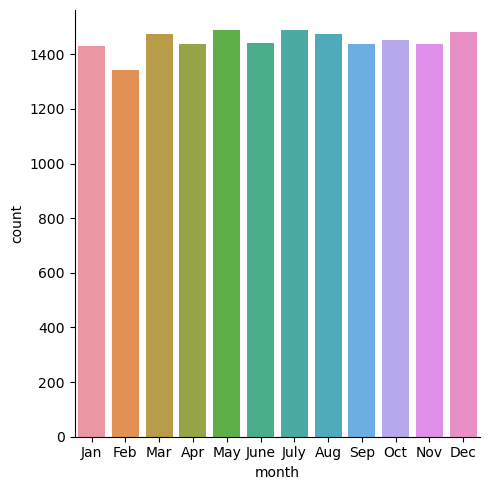

In [44]:
sns.catplot(x='month',data=data_hour_copy,kind='count')

<Axes: ylabel='month'>

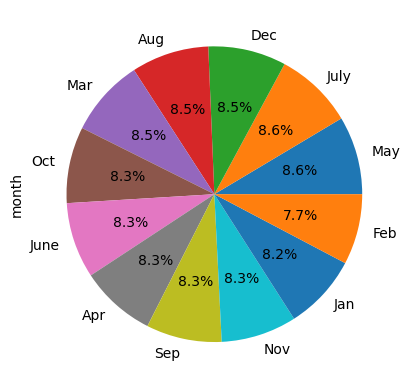

In [45]:
data_hour_copy['month'].value_counts().plot(kind = 'pie', autopct = '%1.1f%%')

#### mapping the week_day

In [46]:
weekday_codes = {0:'Mon',1:'Tue',2:'Wed',3:'Thu',4:'Fri',5:'Sat',6:'Sun'}
data_hour_copy['weekday'] = data_hour_copy['weekday'].map(weekday_codes)

In [47]:
data_hour_copy['weekday'].value_counts()

Sun    2512
Mon    2502
Sat    2487
Tue    2479
Thu    2475
Fri    2471
Wed    2453
Name: weekday, dtype: int64

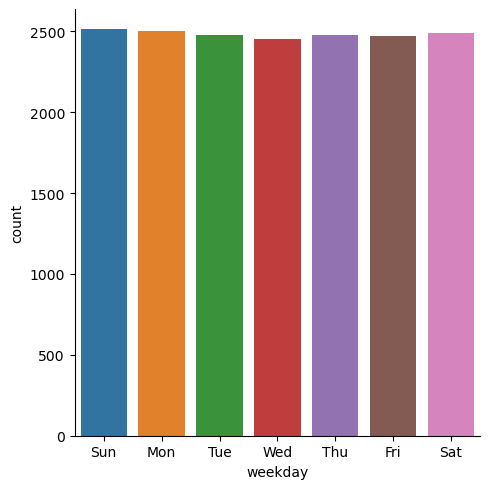

In [48]:
sns.catplot(x='weekday',data=data_hour_copy,kind='count')

<Axes: ylabel='weekday'>

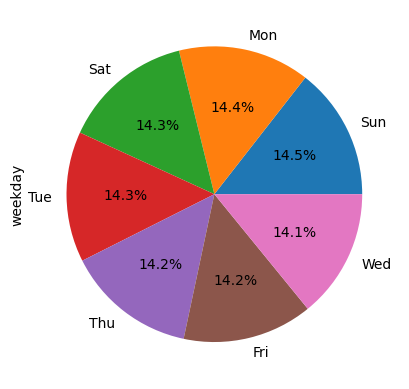

In [49]:
data_hour_copy['weekday'].value_counts().plot(kind = 'pie', autopct = '%1.1f%%')

#### mapping the year

In [50]:
year_codes = {0:"2011",1:"2012"}
data_hour_copy['year'] = data_hour_copy['year'].map(year_codes)

In [51]:
data_hour_copy['year'].value_counts()

2012    8734
2011    8645
Name: year, dtype: int64

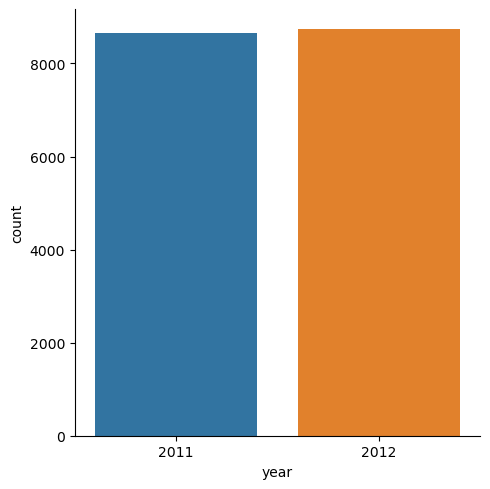

In [52]:
sns.catplot(x='year',data=data_hour_copy,kind='count')

<Axes: ylabel='year'>

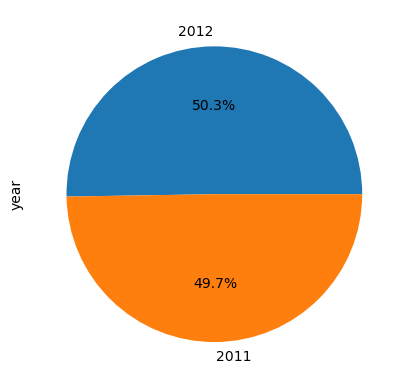

In [53]:
data_hour_copy['year'].value_counts().plot(kind = 'pie', autopct = '%1.1f%%')

### Seperating columns into continous and categorical features

In [54]:
continous_col=['temp','temp_feel_like','humidity','windspeed','registered','registered']
categorical_col=['season','year','month','hour','weekday','workingday','weather_condition']
target=['total_count']

<function matplotlib.pyplot.tight_layout(*, pad=1.08, h_pad=None, w_pad=None, rect=None)>

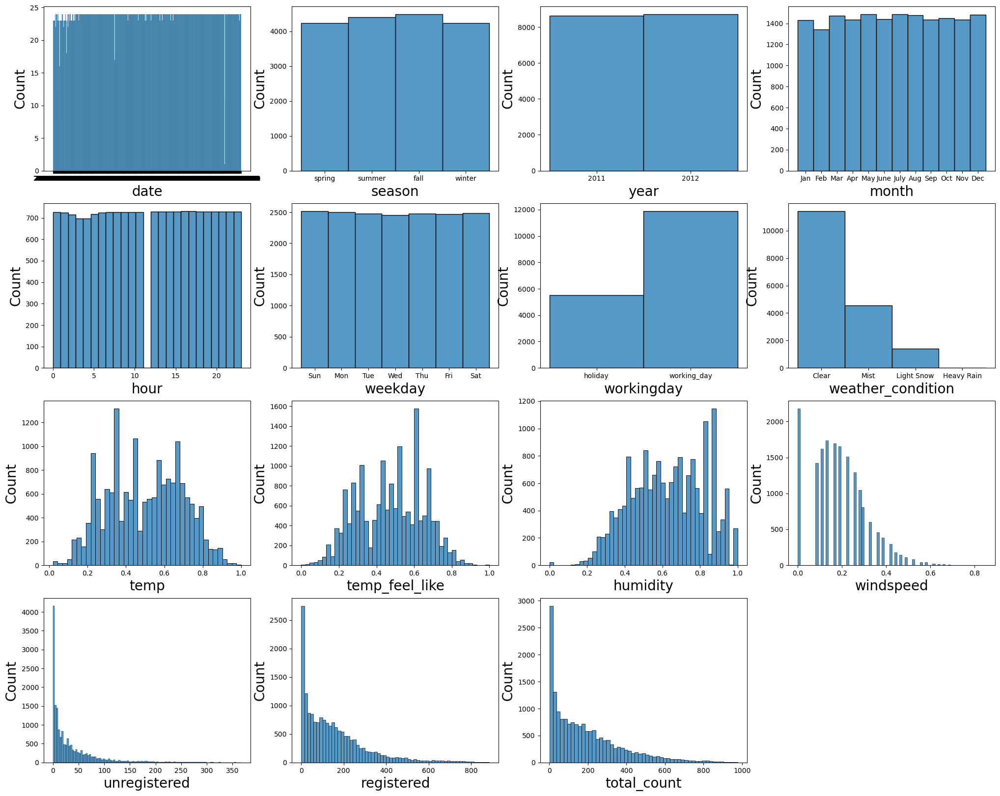

In [55]:
plt.figure(figsize=(25,20))
plotnumber=1    #counter variable
for column in data_hour_copy:
    ax=plt.subplot(4,4,plotnumber)
    sns.histplot(data_hour_copy[column])
    plt.xlabel(column,fontsize=20)
    plt.ylabel('Count',fontsize=20)
    plotnumber+=1
plt.tight_layout 

observation:

    1) There are no much change of frequencies of season, year and weekday

    2) The last month have high count compared with all other months

    3) The total_count is high on no holiday than on holidays

    4 )The total_count is high during workingdays compared to non working days

    5) During clear,partly cloudy weather(1) count is highest And during mist cloudy weather(2) the count gets second 
       highest And followed by third highest during snow,light rain weather(3)

    6) The total_count gets increased as the temp gets warmer and goes back to the lowest at highest temp.
       Also temp_feel_like is similar to temp

    7) The total_count is lowest at low humidity and gets increased as the humidity increase

    8)When there is too much wind bike rental is too low

    9)registered bike rental is higher than unregistered bike rental

### Skewed Data

In [56]:
data_hour_copy.skew().sort_values(ascending=True)

humidity         -0.111287
temp_feel_like   -0.090429
hour             -0.010680
year             -0.010243
temp             -0.006021
windspeed         0.574905
total_count       1.277412
registered        1.557904
unregistered      2.499237
dtype: float64

### scatterplot

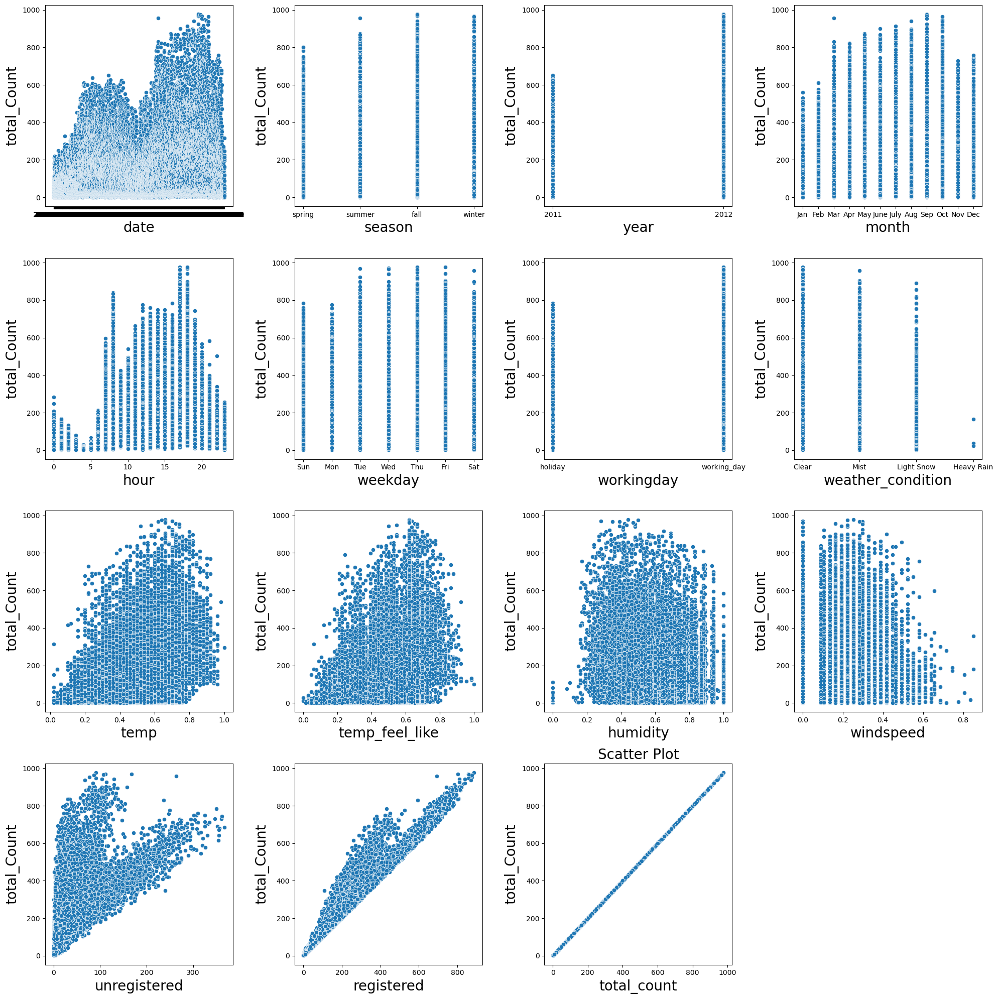

In [57]:
plt.figure(figsize=(20, 20))


plotnumber = 1    # Counter variable

for column in data_hour_copy:
    ax = plt.subplot(4, 4, plotnumber)
    sns.scatterplot(data=data_hour_copy, x=column, y="total_count")
    plt.xlabel(column, fontsize=20)
    plt.ylabel('total_Count', fontsize=20)
    plotnumber += 1

plt.title('Scatter Plot', fontsize=20)
plt.tight_layout()
plt.show()

### Target Variable

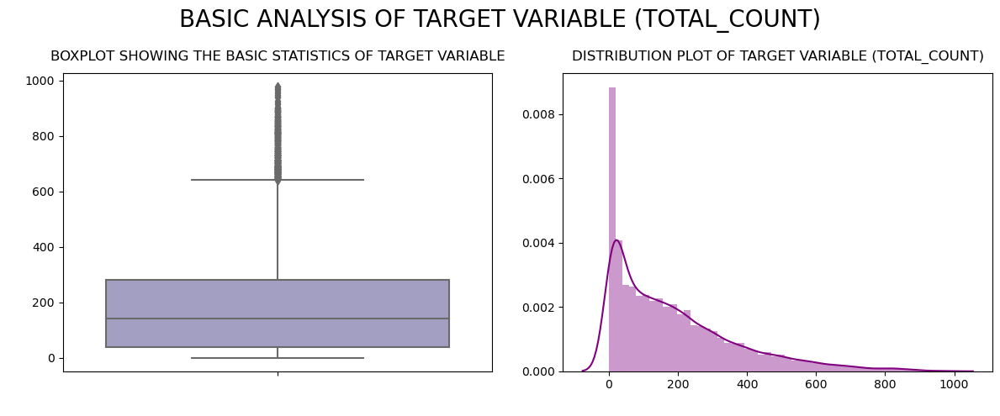

In [58]:

# Creating subplot grid:
fig, ax= plt.subplots(nrows= 1, ncols= 2, figsize= (12, 5))

# Creating main title
fig.suptitle('basic analysis of target variable (total_count)'.upper(), fontsize= 20)

# Populating plot1:
sns.boxplot(y=data_hour_copy['total_count'], ax= ax[0], palette= 'Purples')
ax[0].set_title('boxplot showing the basic statistics of target variable'.upper(), 
                fontsize= 12, fontweight= 20, y= 1.02)
ax[0].set_ylabel(' ')
ax[0].set_xlabel(' ')

# Populating plot2:
sns.distplot(data_hour_copy['total_count'], ax= ax[1], color= 'purple')
ax[1].set_title('distribution plot of target variable (total_count)'.upper(), 
                fontsize= 12, fontweight= 20, y= 1.02)
ax[1].set_ylabel(' ')
ax[1].set_xlabel(' ')

# Setting aesthetics
plt.tight_layout()
plt.show()

### Continuous Independent Variables

In [59]:
data_col_for_anly=data_hour_copy[['temp','temp_feel_like','humidity','windspeed','unregistered','registered']]

In [60]:

# Creating a list of continuous independent variables for analysis
cont_var= [i for i in data_col_for_anly.select_dtypes(exclude= 'object').columns if data_hour_copy[i].nunique() > 2 and i != 'total_count']

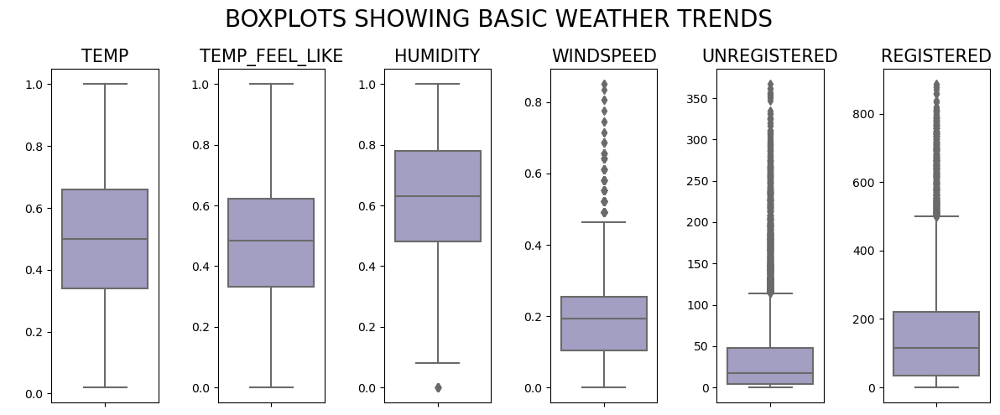

In [61]:
# Creating a subplot grid
fig, ax= plt.subplots(nrows= 1, ncols= len(cont_var), figsize= (12, 5))

# Placing main title
plt.suptitle('boxplots showing basic weather trends'.upper(), fontsize= 20)

# Looping to fill subplot grid with plots
for i in range(len(cont_var)):
    
    sns.boxplot(y=data_col_for_anly[cont_var[i]], ax= ax[i], palette= 'Purples')
    
    # Setting aesthetics and readability
    ax[i].set_title(f'{cont_var[i].upper()}', fontsize= 15)
    ax[i].set_ylabel(' ')

# Setting final aesthetics
plt.tight_layout()
plt.show()

<b>Observations:</b>
    
    - Humidity and windspeed have shown presence of outliers and unregistered    
    
    - Temp and temp_feel_like appear to be almost normally distributed

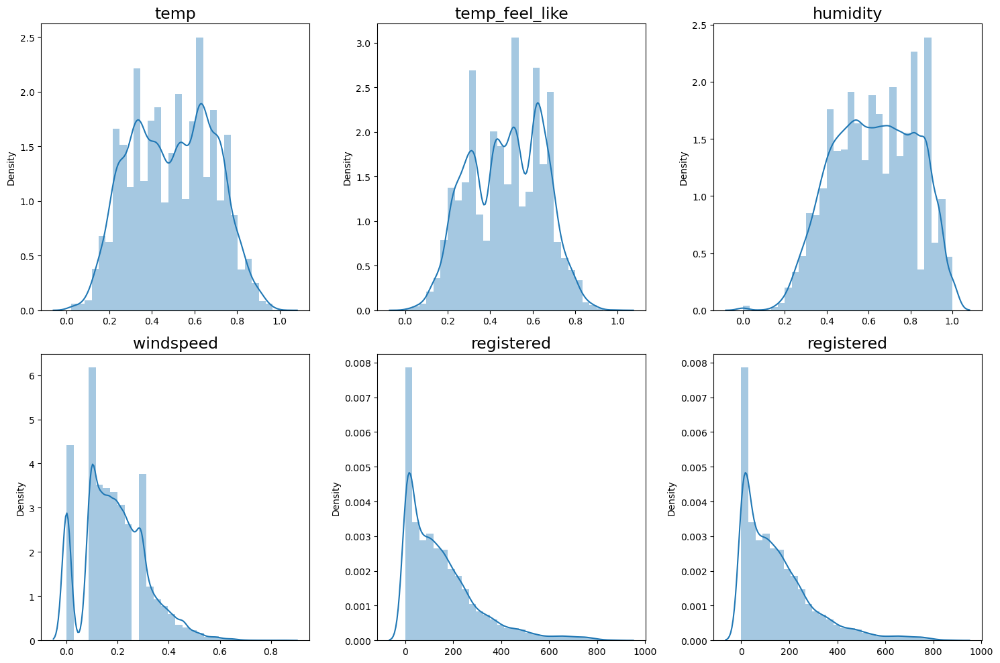

In [62]:
continous_col=['temp','temp_feel_like','humidity','windspeed','registered','registered']
fig, axes = plt.subplots(2,3,figsize = (10,5))
count = 0
for i in range(2):
    for j in range(3):
        s = continous_col[count+j]
        sns.distplot(data_hour_copy[s].values,kde=True, ax = axes[i][j],bins = 30)
        axes[i][j].set_title(s,fontsize=17)
        fig=plt.gcf()
        fig.set_size_inches(15,10)
        plt.tight_layout()
    count = count+j+1 


## Bivariate Analysis

#### Attributes distributions vs target variable

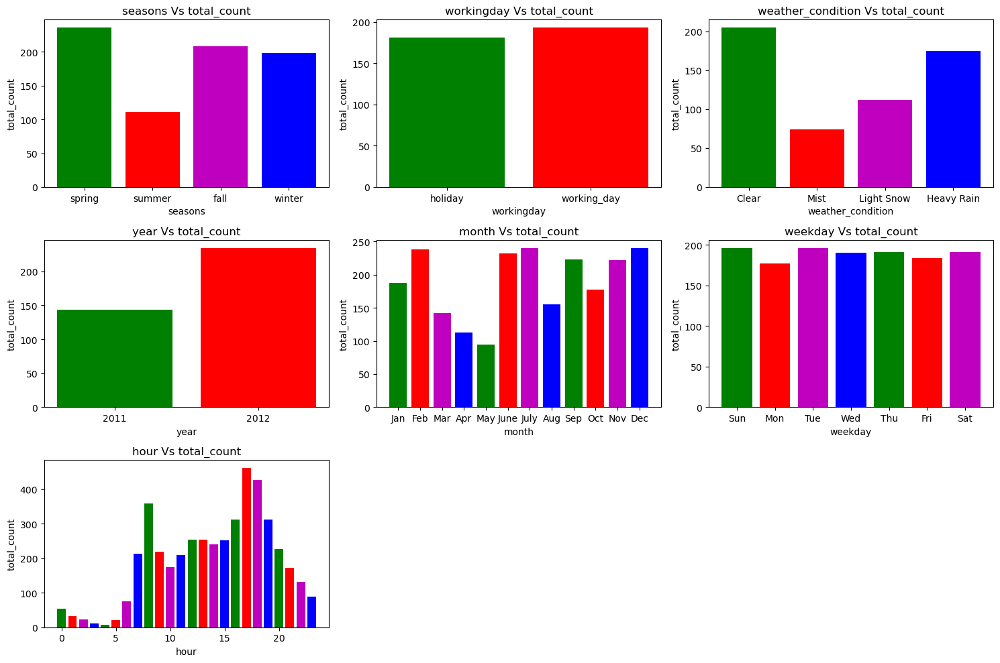

In [63]:
colors = ['g','r','m','b']

plt.figure(figsize=(15,10))
plt.subplot(3,3,1,)
plt.title('seasons Vs total_count')
plt.xlabel('seasons')
plt.ylabel('total_count')
cat_list=data_hour_copy['season'].unique()
cat_average=data_hour_copy.groupby('season').mean()['total_count']
plt.bar(cat_list,cat_average,color=colors)


plt.subplot(3,3,2,)
plt.title('workingday Vs total_count')
plt.xlabel('workingday')
plt.ylabel('total_count')
cat_list=data_hour_copy['workingday'].unique()
cat_average=data_hour_copy.groupby('workingday').mean()['total_count']
plt.bar(cat_list,cat_average,color=colors)

plt.subplot(3,3,3,)
plt.title('weather_condition Vs total_count')
plt.xlabel('weather_condition')
plt.ylabel('total_count')
cat_list=data_hour_copy['weather_condition'].unique()
cat_average=data_hour_copy.groupby('weather_condition').mean()['total_count']
plt.bar(cat_list,cat_average,color=colors)

plt.subplot(3,3,4,)
plt.title('year Vs total_count')
plt.xlabel('year')
plt.ylabel('total_count')
cat_list=data_hour_copy['year'].unique()
cat_average=data_hour_copy.groupby('year').mean()['total_count']
plt.bar(cat_list,cat_average,color=colors)

plt.subplot(3,3,5,)
plt.title('month Vs total_count')
plt.xlabel('month')
plt.ylabel('total_count')
cat_list=data_hour_copy['month'].unique()
cat_average=data_hour_copy.groupby('month').mean()['total_count']
plt.bar(cat_list,cat_average,color=colors)


plt.subplot(3,3,6,)
plt.title('weekday Vs total_count')
plt.xlabel('weekday')
plt.ylabel('total_count')
cat_list=data_hour_copy['weekday'].unique()
cat_average=data_hour_copy.groupby('weekday').mean()['total_count']
plt.bar(cat_list,cat_average,color=colors)

plt.subplot(3,3,7,)
plt.title('hour Vs total_count')
plt.xlabel('hour')
plt.ylabel('total_count')
cat_list=data_hour_copy['hour'].unique()
cat_average=data_hour_copy.groupby('hour').mean()['total_count']
plt.bar(cat_list,cat_average,color=colors)


plt.tight_layout()
pass

#### Seasonwise monthly distribution of counts

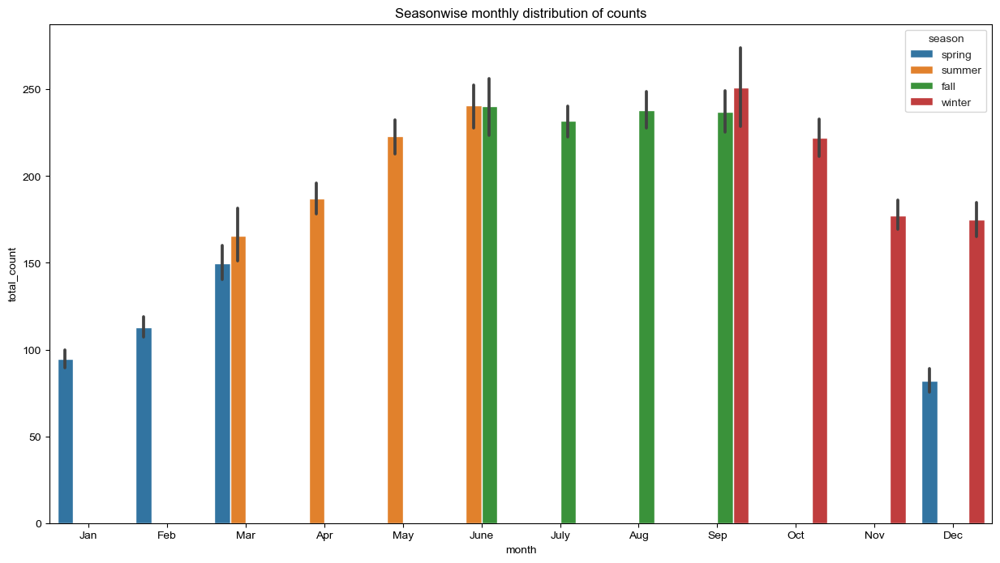

In [64]:
fig,ax=plt.subplots(figsize=(15,8))
sns.set_style('white')
#Bar plot for seasonwise monthly distribution of counts
sns.barplot(x='month',y='total_count',data=data_hour_copy[['month','total_count','season']],hue='season',ax=ax)
ax.set_title('Seasonwise monthly distribution of counts')
plt.show()


From the above plots, we can observed that increasing the bike rental count in fall and summer season and then decreasing the bike rental count in spring and winter season. Here,

#### Weekday wise monthly distribution of counts

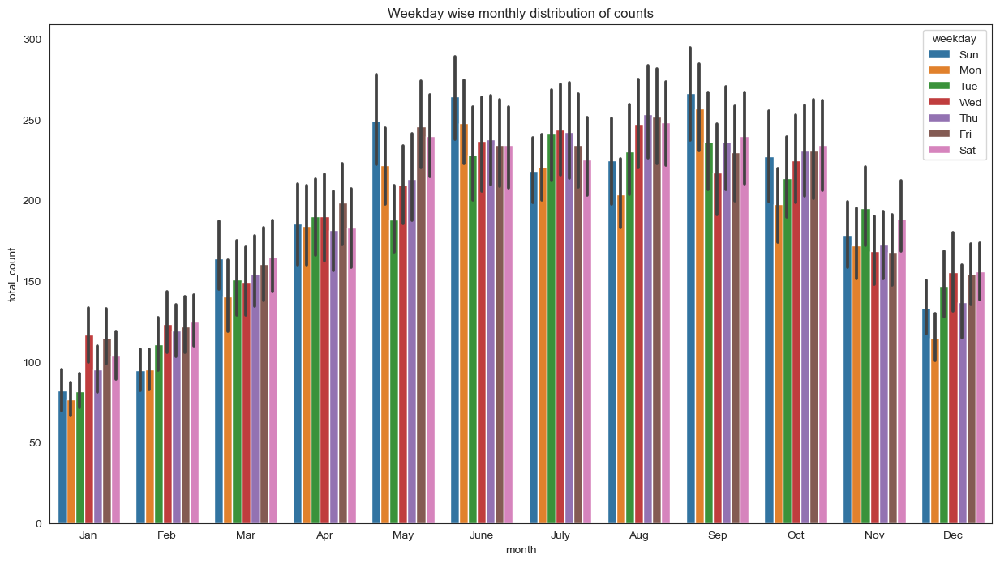

In [65]:
#Bar plot for weekday wise monthly distribution of counts
fig,ax1=plt.subplots(figsize=(15,8))
sns.barplot(x='month',y='total_count',data=data_hour_copy[['month','total_count','weekday']],hue='weekday',ax=ax1)
ax1.set_title('Weekday wise monthly distribution of counts')
plt.show()

#### Yearly wise distribution of counts

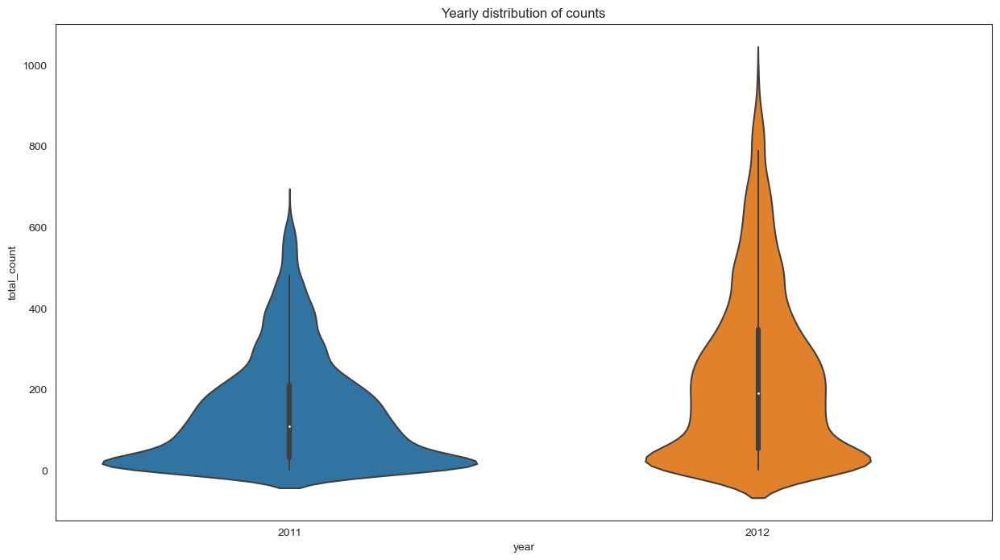

In [66]:
fig,ax=plt.subplots(figsize=(15,8))
#Violin plot for yearly distribution of counts
sns.violinplot(x='year',y='total_count',data=data_hour_copy[['year','total_count']])
ax.set_title('Yearly distribution of counts')
plt.show()

From the violin plot, we can observed that the bike rental count distribution is highest in year 2012 then in year 2011.

#### Workingday wise distribution of counts

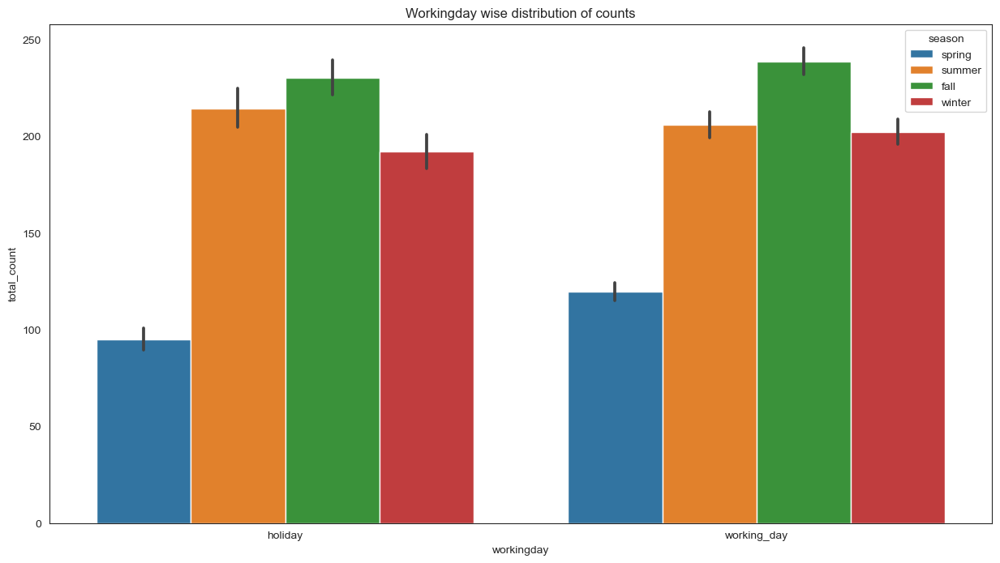

In [67]:
fig,ax=plt.subplots(figsize=(15,8))
#Bar plot for workingday distribution of counts
sns.barplot(data=data_hour_copy,x='workingday',y='total_count',hue='season')
ax.set_title('Workingday wise distribution of counts')
plt.show()

#### Distribution of "registered" and "casual" by Day of Week

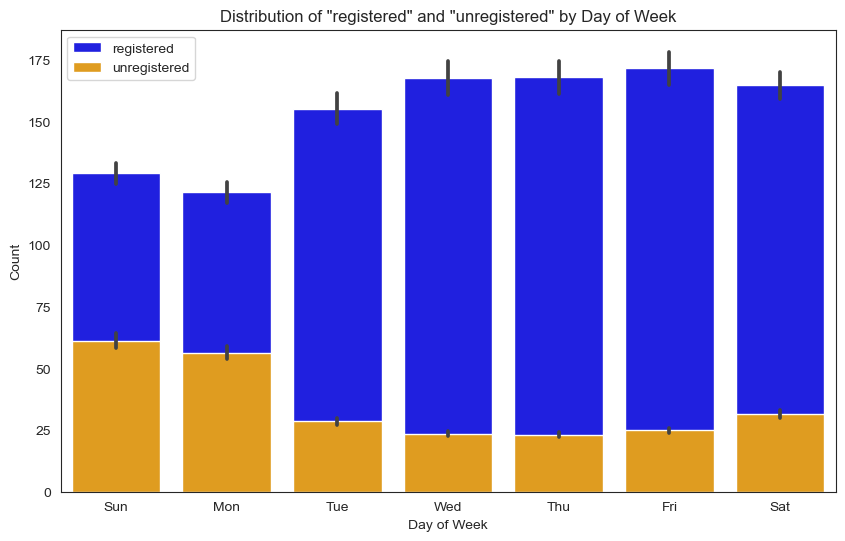

In [68]:
plt.figure(figsize=(10, 6))

# Create a bar plot to visualize distribution of 'registered' and 'unregistered' by 'day'
sns.barplot(data=data_hour_copy, x='weekday', y='registered',color='blue', label='registered')
sns.barplot(data=data_hour_copy, x='weekday', y='unregistered',color='orange' , label='unregistered')

plt.title('Distribution of "registered" and "unregistered" by Day of Week')
plt.xlabel('Day of Week')
plt.ylabel('Count')
plt.legend()


From the above bar plot, we can observed that during workingday the bike rental counts is quite highest compared to during no workingday for different seasons.

#### Weather_condition distribution of counts

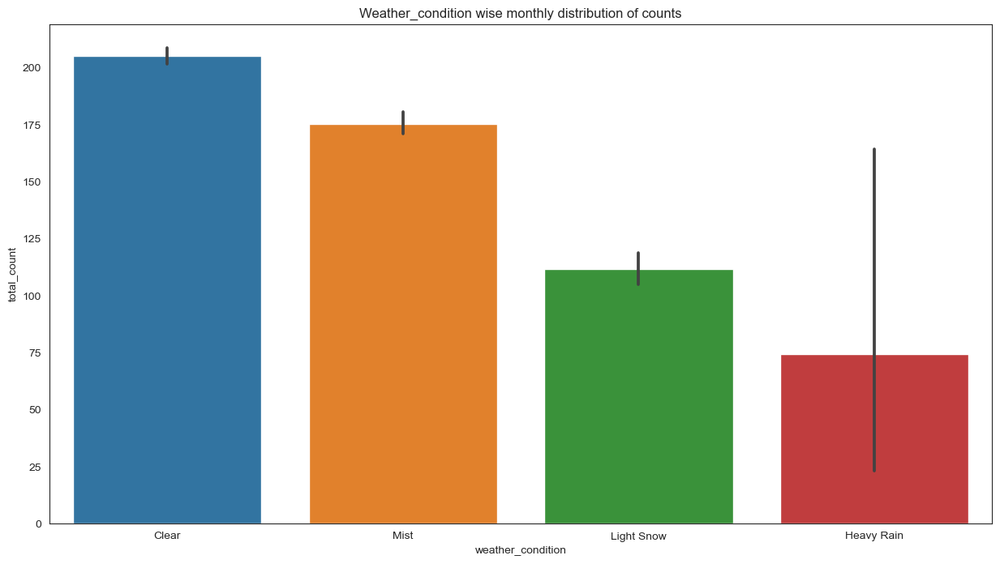

In [69]:
fig,ax1=plt.subplots(figsize=(15,8))
#Bar plot for weather_condition distribution of counts
sns.barplot(x='weather_condition',y='total_count',data=data_hour_copy[['month','total_count','weather_condition']],ax=ax1)
ax1.set_title('Weather_condition wise monthly distribution of counts')
plt.show()

#### no. of rentels every day and every hour

<Axes: xlabel='hour', ylabel='total_count'>

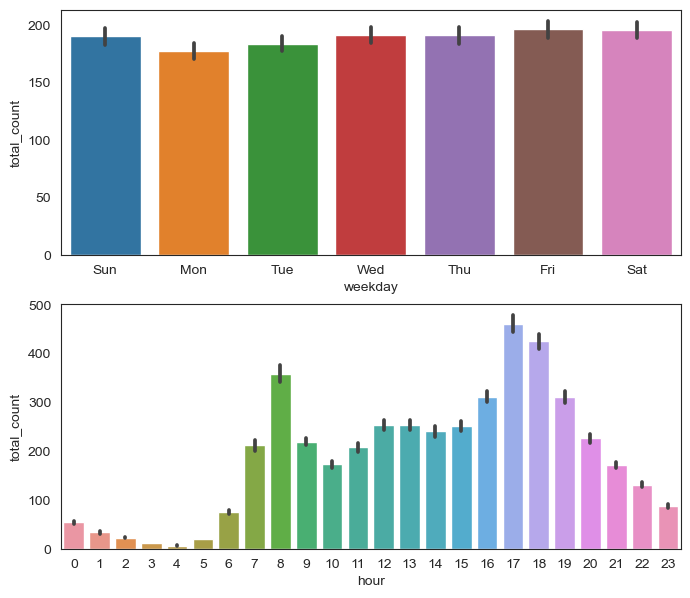

In [70]:
# no. of rentels very day and every hour
fig,(ax1,ax2) = plt.subplots(nrows=2)
fig.set_size_inches(8, 7)
sns.barplot(data=data_hour_copy,x='weekday',y='total_count',ax=ax1)
sns.barplot(data=data_hour_copy,x='hour',y='total_count',ax=ax2)

Observation :

    1. No. of rentels everyday in a month is almost same.

    2. Most number of rentels during 16-19 hour means 4.00 PM to 7.00 PM.

    3. Second most during 7-9 means 7AM to 9AM. Obiously these are office timings

#### monthwise trend of unregistered and registered count

<Axes: xlabel='month', ylabel='registered'>

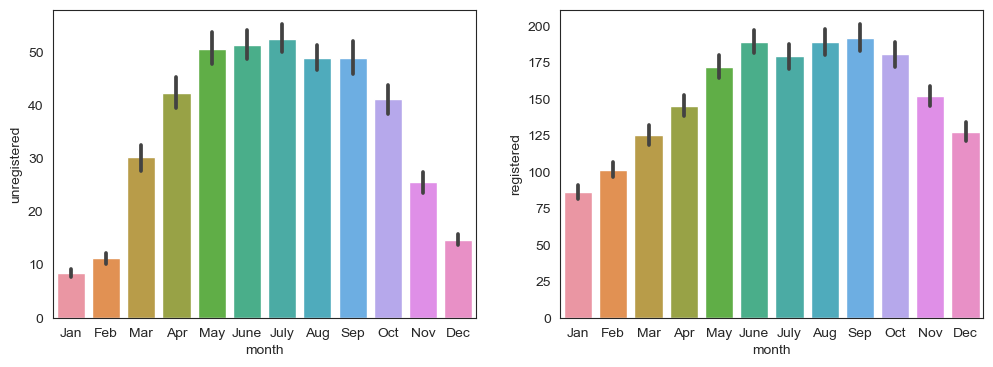

In [71]:
# monthwise trend of casual and registered count
fig,(ax1,ax2) = plt.subplots(ncols=2)
fig.set_size_inches(12,4)
sns.barplot(data=data_hour_copy,x='month',y='unregistered',ax=ax1)
sns.barplot(data=data_hour_copy,x='month',y='registered',ax=ax2)

#### Daily Counts for Jan-Feb 2011

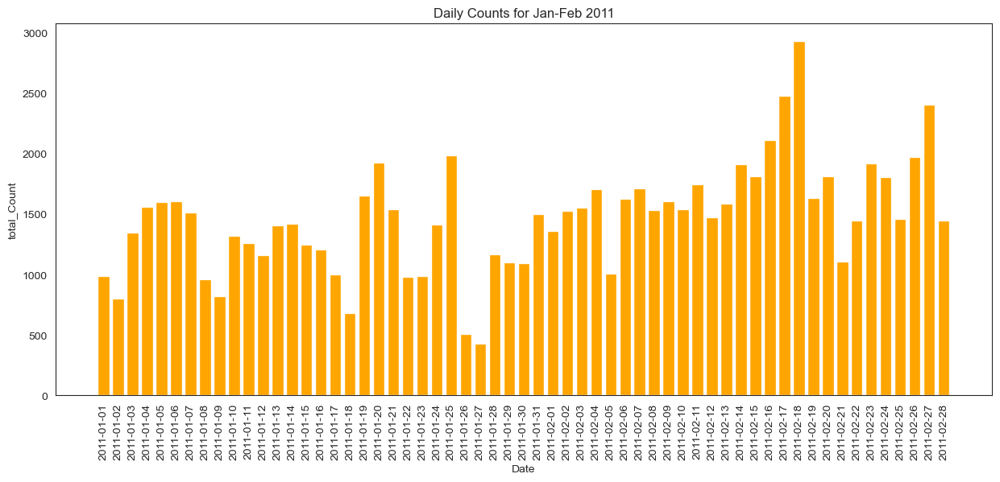

In [72]:
filtered_df = data_hour_copy[(data_hour_copy['date'] >= '2011-01-01') & (data_hour_copy['date'] <= '2011-02-28')]
daily_counts = filtered_df.groupby(filtered_df['date'])['total_count'].sum()
dates = daily_counts.index
counts = daily_counts.values
plt.figure(figsize=(15,6))
plt.bar(dates, counts, color='orange')
plt.xlabel('Date')
plt.ylabel('total_Count')
plt.title('Daily Counts for Jan-Feb 2011')
plt.xticks(rotation=90)
plt.show()

#### Humidity Density by Seasons

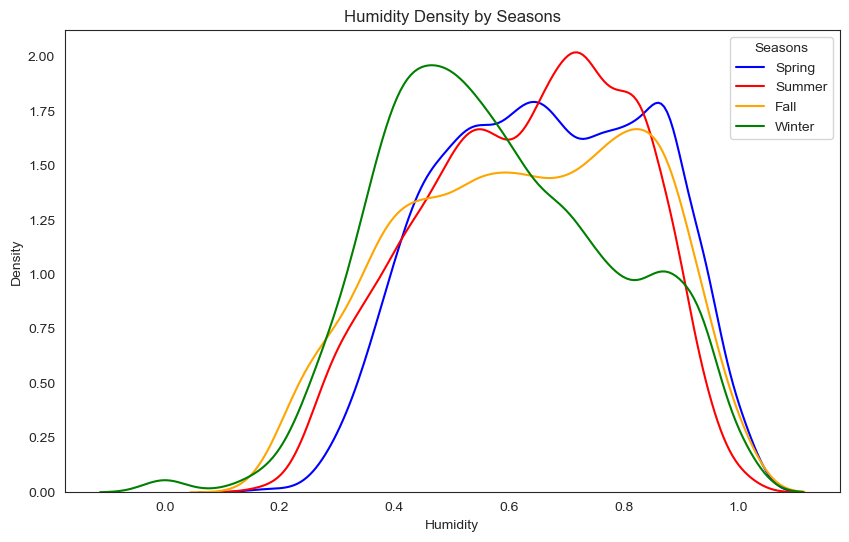

In [73]:
season_colors = {
    'Spring': 'green',
    'Summer': 'orange',
    'Fall': 'red',
    'Winter': 'blue'
}

# Set up the plot
plt.figure(figsize=(10, 6))

# Create a kernel density plot of humidity by season with custom colors
sns.kdeplot(data=data_hour_copy, x='humidity', hue='season', common_norm=False, palette=season_colors.values())
plt.title('Humidity Density by Seasons')
plt.xlabel('Humidity')
plt.ylabel('Density')
plt.legend(title='Seasons', labels=season_colors.keys())

plt.show()

#### Temperature Density by Seasons

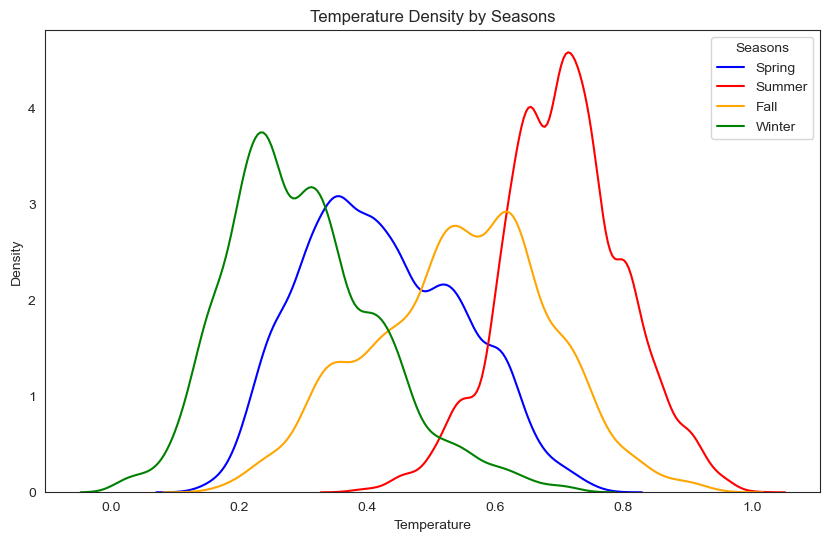

In [74]:
season_colors = {
    'Spring': 'green',
    'Summer': 'orange',
    'Fall': 'red',
    'Winter': 'blue'
}

# Set up the plot
plt.figure(figsize=(10, 6))

# Create a kernel density plot of temperature by season with custom colors
sns.kdeplot(data=data_hour_copy, x='temp', hue='season', common_norm=False, palette=season_colors.values())
plt.title('Temperature Density by Seasons')
plt.xlabel('Temperature')
plt.ylabel('Density')
plt.legend(title='Seasons', labels=season_colors.keys())

plt.show()

<b>Observations:</b>

        The graphs clearly show that humidity levels during spring are not appreciably high to significantly reduce bike rentals. Furthermore, temperatures are not too low to affect the number of rentals. In fact, during summer, both humidity and temperature are Significantly higher, this did not affect bicycle rentals. Likewise, the remaining seasons show similar levels of humidity and temperature as spring, though only spring has the lowest number of bicycle fares.

        This indicates that weather conditions, while a contributing factor, may not be the only driver of lower rents during the spring season. It is plausible that the distribution of the data could influence this outcome. Spring may have a relatively smaller data set compared to other seasons, which can lead to observed fluctuations in rental numbers.

#### relationship of continuous variables with target variable

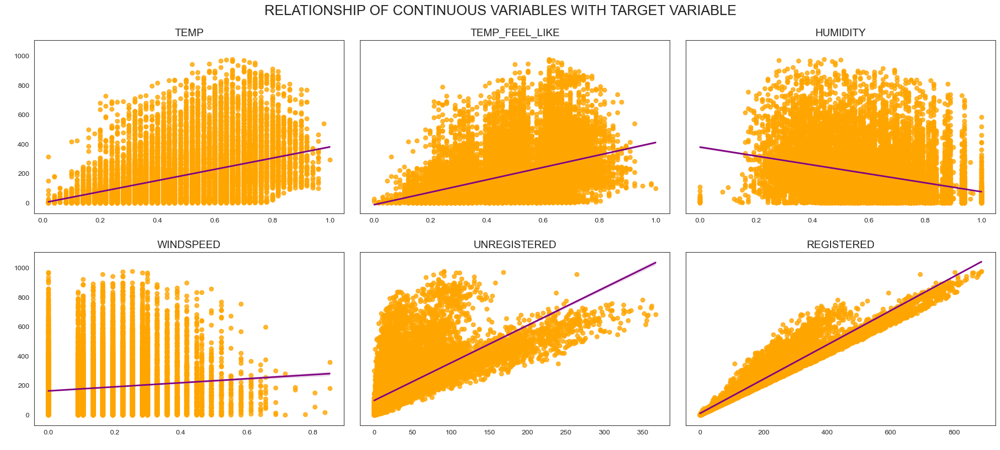

In [75]:

# Creating a subplot grid
fig, ax= plt.subplots(nrows= 2, ncols= int(len(cont_var)/2), figsize= (20, 9), sharey= True)

# Placing main title
plt.suptitle('relationship of continuous variables with target variable'.upper(), fontsize= 20, fontweight= 20, y= 0.99)

# Looping to fill subplot grid with plots
k= 0
for i in range(2):
    for j in range(int(len(cont_var)/2)):
        sns.regplot(x= data_hour_copy[cont_var[k]], y=data_hour_copy['total_count'], ax= ax[i, j],
                    scatter_kws= {'color': 'orange'}, line_kws= {'color': 'purple'})
    
        # Setting aesthetics and readability
        ax[i,j].set_title(f'{cont_var[k].upper()}', fontsize= 15)
        ax[i,j].set_ylabel(' ')
        ax[i,j].set_xlabel(' ')
    
        k+=1

# Setting final aesthetics
plt.tight_layout()
plt.show()

<b>Observations:</b>
- Bike demand shows a similar and directly proportional relationship with temp and temp_feel_like
- Bike demand shows inverse proportionality with Humidity .
- Bike demand is directly proportional to unregistered  and Registered numbers.
- Bike demand is very well explained by the registered users.

#### Hour based analysis on different attributes

<Axes: xlabel='hour', ylabel='total_count'>

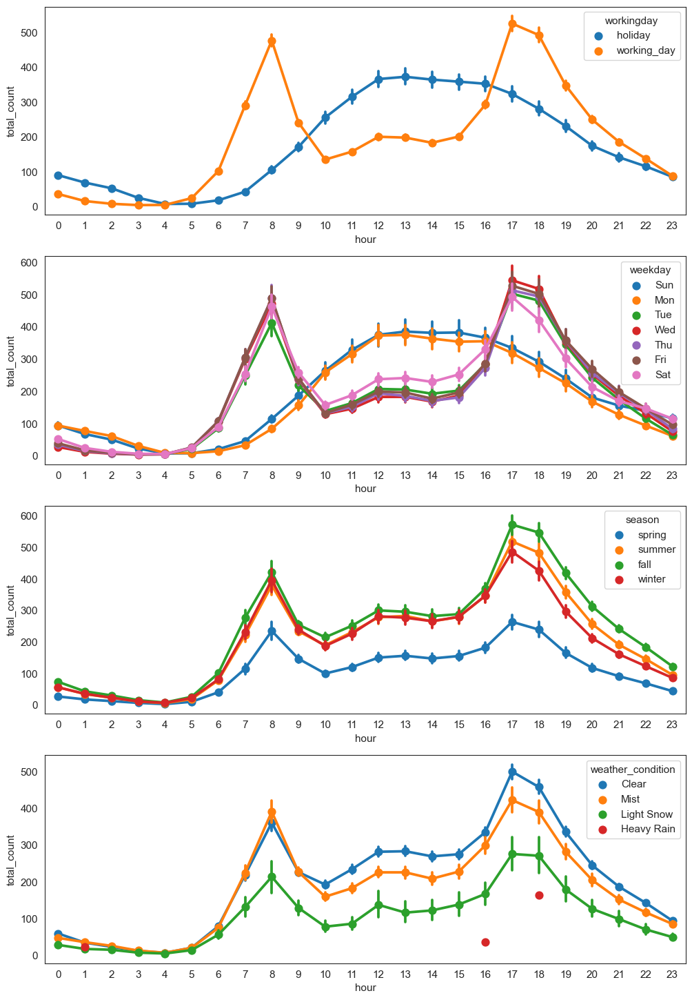

In [76]:
plt.rc('font', size = 11)
figure, axes = plt. subplots(nrows = 4) 
figure.set_size_inches(12, 18)

sns.pointplot(x = 'hour', y = 'total_count', data = data_hour_copy, hue = 'workingday', ax = axes[0])

sns.pointplot(x = 'hour', y = 'total_count',data = data_hour_copy, hue = 'weekday', ax = axes[1])
sns.pointplot(x = 'hour', y = 'total_count', data = data_hour_copy, hue = 'season', ax = axes[2])
sns.pointplot(x = 'hour', y = 'total_count', data = data_hour_copy, hue = 'weather_condition', ax = axes[3])


**Observations**
* Higher reservations can be seen at around 8am and 5pm (office hours) and close to 0 reservations very early in the morning
* From the above plot we can see the 2 patterns across the hours in a day in bike rentals
    * Working Day: First pattern where there is a peak in the rentals at around 8am and another at around 5pm. These correspond to working local bikers who typically are ``registered`` and go to work on ``working day`` which are ``Monday`` to ``Friday``
    * Non Working Day: Second pattern where there is more or less a uniform rentals across the day with a peak at around noon time. These correspond to probably tourists who typically are ``casual`` users who rent/drop off bikes uniformly during the day and tour the city of Washington on ``non working days`` which typically are ``Saturday`` and ``Sunday``
* Also, we can see that we have more bike rentals during the Fall (July to September) and Summer (April to June) Season.

#### 2011 and 2012 Rentals

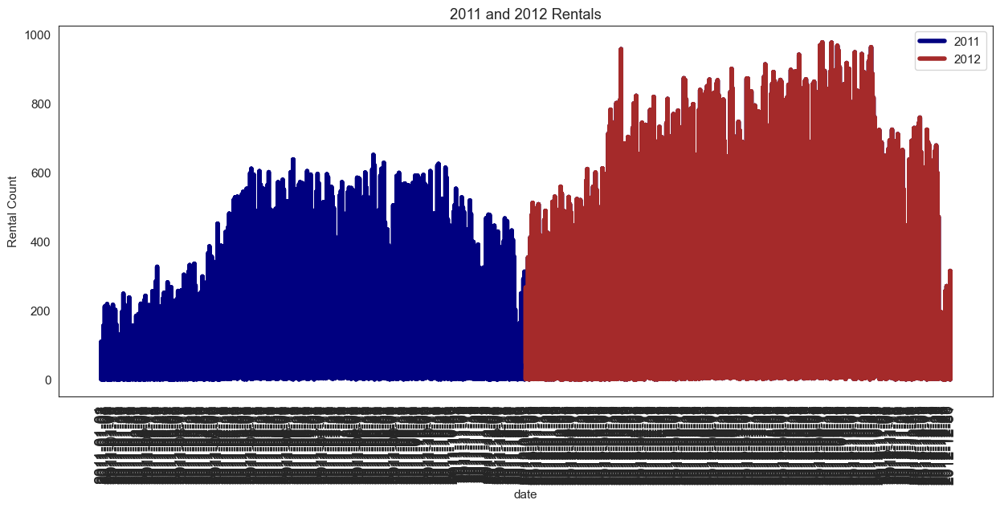

In [77]:
plt.figure(figsize=(15,6))
df_2011 = data_hour_copy[data_hour_copy['date'] >= '2011-01-01']
df_2012 = data_hour_copy[data_hour_copy['date'] >= '2012-01-01']

plt.plot(df_2011['date'], df_2011['total_count'], label='2011',color="navy",lw=4)
plt.plot(df_2012['date'], df_2012['total_count'], label='2012',color="brown",lw=4)
plt.xticks(fontsize=14, rotation=90)
plt.xlabel('date')
plt.ylabel('Rental Count')
plt.title('2011 and 2012 Rentals')
plt.legend()
plt.show()

#### Working Day/Non Working Day : Count vs. Day Hour with Temperature Gradient

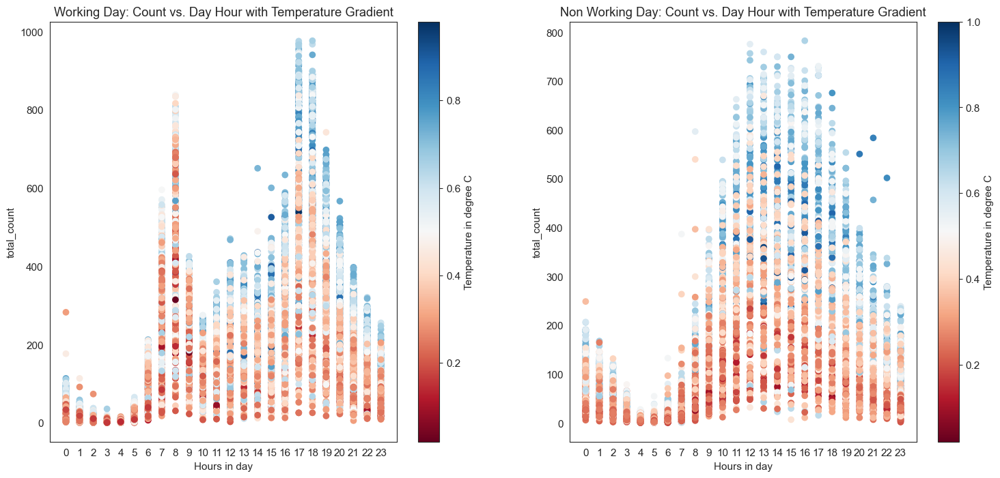

In [78]:
mydata_w = data_hour_copy[data_hour_copy.workingday=='working_day']
mydata_nw = data_hour_copy[data_hour_copy.workingday=='holiday']

fig = plt.figure(figsize=(18, 8))
# Working Day
axes = fig.add_subplot(1, 2, 1)
f = axes.scatter(mydata_w.hour, mydata_w['total_count'], c=mydata_w.temp, cmap = 'RdBu')
axes.set(xticks = range(24), xlabel='Hours in day', ylabel='total_count', title='Working Day: Count vs. Day Hour with Temperature Gradient')
cbar = plt.colorbar(f)
cbar.set_label('Temperature in degree C')

# Non Working Day
axes = fig.add_subplot(1, 2, 2)
f = axes.scatter(mydata_nw.hour, mydata_nw['total_count'], c=mydata_nw.temp, cmap = 'RdBu')
axes.set(xticks = range(24), xlabel='Hours in day', ylabel='total_count', title='Non Working Day: Count vs. Day Hour with Temperature Gradient')
cbar = plt.colorbar(f)
cbar.set_label('Temperature in degree C')

plt.show()

<b>Observations:</b>

    From the above, we can see that in general, more people tend to prefer biking at moderate to high temperatures; however, if the temperature is too hot (darkest of the blue dots), there is a small decline in count. 

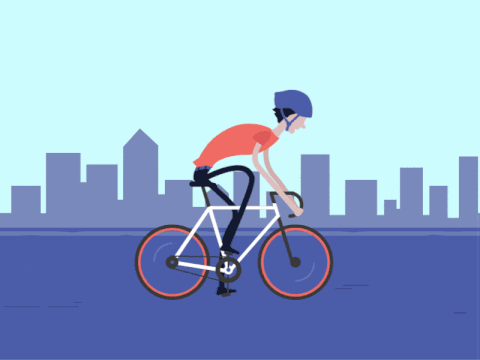

### Make a another copy of dataset

In [79]:
data_hour_copy_1=data_hour_copy.copy(deep=True)

### Outliers Analysis

Weather = 'Heavy Rain' outlier

We had earlier seen a single observation with 'Heavy Snow/Rain' recording. Let us extract that observation to see if it is an outlier and how we should handle that data point.

In [80]:
heavy_weather_data = data_hour_copy_1.loc[data_hour_copy_1['weather_condition']=='Heavy Rain', :]
# Replacing Heavy/Snow Rain condition with Light Snow/Rain
data_hour_copy_1.loc[data_hour_copy_1['weather_condition']=='Heavy Rain', 'weather_condition'] = 'Light Snow'


In [81]:
data_hour_copy_1['weather_condition'].unique()

array(['Clear', 'Mist', 'Light Snow'], dtype=object)

### Zscore >4 for Pruning

Let us first take a look at the data entries with zscore > 4, i.e., data with more than 4 standard deviation away from the mean.

In [82]:
# Function to calculate zscore
def zscore(series): 
    return (series-series.mean())/series.std()

data_hour_copy_1['count_zscore'] = data_hour_copy_1.groupby(['hour', 'workingday'])['total_count'].transform(zscore)
outlier_idx = np.abs(data_hour_copy_1['count_zscore'])>4
outlier_data = data_hour_copy_1.loc[outlier_idx, :]
print('Shape of the outlier data entries: ', outlier_data.shape)

outlier_data.head(5)

Shape of the outlier data entries:  (22, 16)


,date,season,year,month,hour,weekday,workingday,weather_condition,temp,temp_feel_like,humidity,windspeed,unregistered,registered,total_count,count_zscore
2669,2011-04-26,summer,2011,Apr,3,Wed,working_day,Clear,0.54,0.5152,0.88,0.2836,17,4,21,4.718512
2810,2011-05-02,summer,2011,May,0,Tue,working_day,Clear,0.46,0.4545,0.72,0.1343,68,109,177,5.730694
2811,2011-05-02,summer,2011,May,1,Tue,working_day,Clear,0.46,0.4545,0.72,0.1343,41,73,114,8.342855
2812,2011-05-02,summer,2011,May,2,Tue,working_day,Mist,0.44,0.4394,0.77,0.2239,16,19,35,4.009226
4588,2011-07-15,fall,2011,July,2,Sat,working_day,Clear,0.60,0.5758,0.78,0.1642,16,22,38,4.466271


All the outliers occur mostly early in the morning or late at night. Let us prune out these outliers. These could be due to some late night shows or holiday or some party.

In [83]:
# Removing outliers from mydata
mydata_without_outliers = data_hour_copy_1.loc[~outlier_idx, :]
print('Shape of data before outliner pruning: ', data_hour_copy_1.shape)
print('Shape of data after outlier pruning: ', mydata_without_outliers.shape)

Shape of data before outliner pruning:  (17379, 16)
Shape of data after outlier pruning:  (17357, 16)


Dropping the zscore column from the data frame.

In [84]:
# Dropping the zscore column
mydata_without_outliers = mydata_without_outliers.drop('count_zscore', axis=1)
mydata_without_outliers.head(n=3)

,date,season,year,month,hour,weekday,workingday,weather_condition,temp,temp_feel_like,humidity,windspeed,unregistered,registered,total_count
0,2011-01-01,spring,2011,Jan,0,Sun,holiday,Clear,0.24,0.2879,0.81,0.0,3,13,16
1,2011-01-01,spring,2011,Jan,1,Sun,holiday,Clear,0.22,0.2727,0.80,0.0,8,32,40
2,2011-01-01,spring,2011,Jan,2,Sun,holiday,Clear,0.22,0.2727,0.80,0.0,5,27,32


### Correlation Analysis

#### Regression Plots vs. Temperature, Humidity and Windspeed

Using seaborn to get regression plots with respect to Temperature, Humidity and Windspeed.

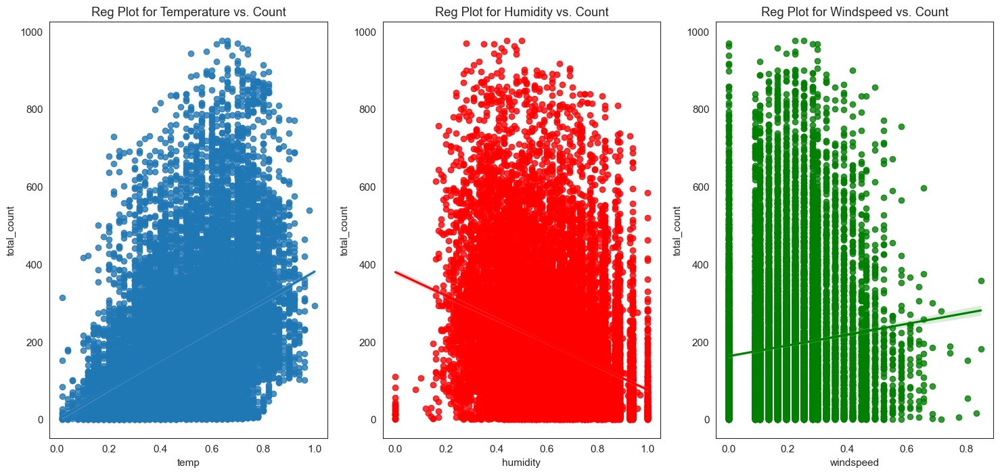

In [85]:
# Regression Plots with respect to Temperature, Humidity and Windspeed
fig = plt.figure(figsize=(18, 8))
axes = fig.add_subplot(1, 3, 1)
sns.regplot(data=mydata_without_outliers, x='temp', y='total_count',ax=axes)
axes.set(title='Reg Plot for Temperature vs. Count')
axes = fig.add_subplot(1, 3, 2)
sns.regplot(data=mydata_without_outliers, x='humidity', y='total_count',ax=axes, color='r')
axes.set(title='Reg Plot for Humidity vs. Count')
axes = fig.add_subplot(1, 3, 3)
sns.regplot(data=mydata_without_outliers, x='windspeed', y='total_count',ax=axes, color='g')
axes.set(title='Reg Plot for Windspeed vs. Count')
plt.show()

**Observations**
* The above regplot indicates a positive correlation of count with temperature and windspeed and a negative correlation with humidity

### Heatmap

Using heatmap plots of all the numerical features to obtain correlation of the bike rental with other numerical features

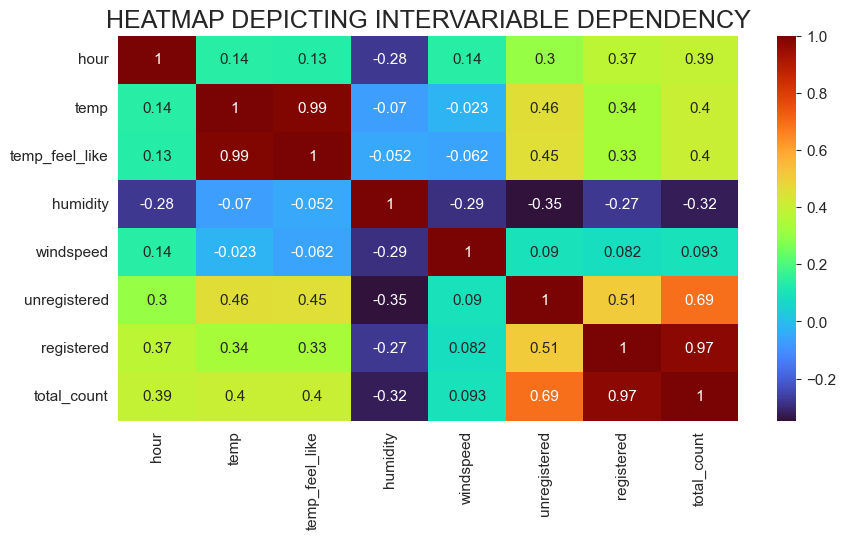

In [86]:
# Setting plot size
plt.figure(figsize=(10,5))

# Plotting Heatmap
sns.heatmap(data_hour_copy.corr(), annot= True, cmap= 'turbo')

# Setting title
plt.title('heatmap depicting intervariable dependency'.upper(), fontsize= 18, y= 1)

plt.show()

#### variance_inflation_factor for Correlation

In [87]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [88]:
def get_vif(data_hour_copy):
    vif=pd.DataFrame()
    vif['variables']=data_hour_copy.columns
    vif['VIF']=[variance_inflation_factor(data_hour_copy.values,i) for i in range (data_hour_copy.shape[1])]
    
    return vif
                                                                                   

In [89]:
get_vif(data_hour_copy[[i for i in data_hour_copy.describe().columns]])

,variables,VIF
0,hour,4.170991
1,temp,319.645077
2,temp_feel_like,350.627535
3,humidity,6.959794
4,windspeed,3.006867
5,unregistered,inf
6,registered,inf
7,total_count,inf


**Inferences from the above heatmap**
* temp (true temperature) and atemp (feels like temperature) are highly correlated as expected
* total_count is highly correlated with unregistered(casual) and registered as expected since total_count = unregistered(casual) + registered
* We see a positive correlation between total_count and temperature (as was seen in the regplot). This is probably only true for the range of temperatures provided
* We see a negative correlation between total_count and humidity. The more the humidity, the less people prefer to bike
* Not a great amount of correlation between humidity and temperature, though
* total_Count has a weak dependence on windspeed

### Feature Engineering

We have lots of categorical columns. We will transform each relevant and important categorical columns into binary vector columns. Later drop all the columns that are not required (redundant or very low correlation).

#### Summary of the column transformations

* Season: Month column has a direct mapping with season (Winter: January to March, Summer: April to June, Fall: July to September and Spring: October to December). Hence we will drop season column
* Holiday and 'day': workingday = weekday and not a holiday. Since we noticed that there were two kinds of bike rental behavoirs - during working days and not a working day, we will retain only the workingday column and drop 'day' and 'holiday' column
* Workingday: After observing the bike rental trend, we propose to build 2 separate models for 1. if it is a working day, and 2. if it is a non-working day. Hence, we can separate out the data based on  this column and drop the column
* Weather: Split weather column to weather_1, weather_2 and weather 3 (recall that we had relabelled all the weather = 4 data points to weather = 3 due to its sparseness). Drop weather_3 since it is a function of the rest of the weather columns
* Temp: temp and atemp are highly correlated. Hence retain only the temp column 
* Windspeed: Very poorly correlated with count. Hence drop this column
* Casual and registered: These are individual components of our to be predicted column (count). Hence drop these columns
* Month: Split month column to month_1, month_2, ..., month_12. Drop month_12 since it is a function of the rest of the month columns
* Date: Intuitively, there is should be no dependency on date. Hence drop this column
* Hour: Split hour column to hour_0, hour_1, ..., hour_23. Drop hour_23 since it is a function of the rest of the hour columns


In [90]:
# Using numbers to represent categorical data to transform the categorical columns

season_inv_dict = {'spring':1, 'summer':2, 'fall':3, 'winter':4}
weather_inv_dict = {'Clear':1, 'Mist':2, 'Light Snow':3, 'Heavy Rain':4}
day_inv_dict = {'Mon':0, 'Tue':1, 'Wed':2, 'Thu':3, 'Fri':4, 'Sat':5, 'Sun':6}
month_inv_dict = {'Jan':1, 'Feb':2, 'Mar':3, 'Apr':4, 'May':5, 'June':6, 'July':7, 'Aug':8, 'Sep':9, 'Oct':10, 'Nov':11, 'Dec':12}
workingday_inv_dict = {'holiday':0 , 'working_day':1}
year_inv_dict = {"2011":0, "2012":1}


mydata_without_outliers['season'] = mydata_without_outliers['season'].map(season_inv_dict)
mydata_without_outliers['weather_condition'] = mydata_without_outliers['weather_condition'].map(weather_inv_dict)
mydata_without_outliers['weekday'] = mydata_without_outliers['weekday'].map(day_inv_dict)
mydata_without_outliers['month'] = mydata_without_outliers['month'].map(month_inv_dict)
mydata_without_outliers['workingday'] = mydata_without_outliers['workingday'].map(workingday_inv_dict)
mydata_without_outliers['year'] = mydata_without_outliers['year'].map(year_inv_dict)



# Dropping columns from the provided data set that are either highly correlated with the existing columns: 
# season with month, holiday and day with workingday, temp with atemp
# or poorly correlated with the target column: windspeed and date

drop_columns_1 = ['season', 'year', 'temp_feel_like', 'windspeed', 'date', 'weekday','unregistered']
mydata_without_outliers = mydata_without_outliers.drop(drop_columns_1, axis=1)

mydata_without_outliers.head(n=3)

,month,hour,workingday,weather_condition,temp,humidity,registered,total_count
0,1,0,0,1,0.24,0.81,13,16
1,1,1,0,1,0.22,0.80,32,40
2,1,2,0,1,0.22,0.80,27,32


Transforming all the categorical columns into binary columns...

In [91]:
# Transforming all the categorical columns into binary columns
month=pd.get_dummies(mydata_without_outliers['month'], prefix='month')
weather=pd.get_dummies(mydata_without_outliers['weather_condition'], prefix='weather')
hour=pd.get_dummies(mydata_without_outliers['hour'], prefix='hour')
workingday=pd.get_dummies(mydata_without_outliers['workingday'], prefix='workingday')
mydata_train=pd.concat([mydata_without_outliers, weather, month, hour,workingday],axis=1)

mydata_train.columns


Index(['month', 'hour', 'workingday', 'weather_condition', 'temp', 'humidity',
       'registered', 'total_count', 'weather_1', 'weather_2', 'weather_3',
       'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6',
       'month_7', 'month_8', 'month_9', 'month_10', 'month_11', 'month_12',
       'hour_0', 'hour_1', 'hour_2', 'hour_3', 'hour_4', 'hour_5', 'hour_6',
       'hour_7', 'hour_8', 'hour_9', 'hour_10', 'hour_11', 'hour_12',
       'hour_13', 'hour_14', 'hour_15', 'hour_16', 'hour_17', 'hour_18',
       'hour_19', 'hour_20', 'hour_21', 'hour_22', 'hour_23', 'workingday_0',
       'workingday_1'],
      dtype='object')

Dropping columns and the last binary vector column (which are fully correlated and can be expressed as a function of other columns)

In [92]:
# Dropping columns and the last binary vector column 
drop_columns_2 = ['weather_condition', 'month', 'hour', 'weather_3', 'month_12', 'hour_23','workingday','registered']

mydata_train = mydata_train.drop(drop_columns_2, axis=1)

list(mydata_train.columns)

['temp',
 'humidity',
 'total_count',
 'weather_1',
 'weather_2',
 'month_1',
 'month_2',
 'month_3',
 'month_4',
 'month_5',
 'month_6',
 'month_7',
 'month_8',
 'month_9',
 'month_10',
 'month_11',
 'hour_0',
 'hour_1',
 'hour_2',
 'hour_3',
 'hour_4',
 'hour_5',
 'hour_6',
 'hour_7',
 'hour_8',
 'hour_9',
 'hour_10',
 'hour_11',
 'hour_12',
 'hour_13',
 'hour_14',
 'hour_15',
 'hour_16',
 'hour_17',
 'hour_18',
 'hour_19',
 'hour_20',
 'hour_21',
 'hour_22',
 'workingday_0',
 'workingday_1']

In [93]:
mydata_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 17357 entries, 0 to 17378
Data columns (total 41 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   temp          17357 non-null  float64
 1   humidity      17357 non-null  float64
 2   total_count   17357 non-null  int64  
 3   weather_1     17357 non-null  uint8  
 4   weather_2     17357 non-null  uint8  
 5   month_1       17357 non-null  uint8  
 6   month_2       17357 non-null  uint8  
 7   month_3       17357 non-null  uint8  
 8   month_4       17357 non-null  uint8  
 9   month_5       17357 non-null  uint8  
 10  month_6       17357 non-null  uint8  
 11  month_7       17357 non-null  uint8  
 12  month_8       17357 non-null  uint8  
 13  month_9       17357 non-null  uint8  
 14  month_10      17357 non-null  uint8  
 15  month_11      17357 non-null  uint8  
 16  hour_0        17357 non-null  uint8  
 17  hour_1        17357 non-null  uint8  
 18  hour_2        17357 non-nu

### Split Data for Training and Testing

In [94]:
X = mydata_train.drop('total_count', axis=1)
y = mydata_train['total_count']

In [95]:
print(X.shape)
print(y.shape)

(17357, 40)
(17357,)


#### creating training and testing data

In [96]:
from sklearn.model_selection import train_test_split

In [97]:
X_train,X_test,y_train,y_test = train_test_split (X, y, test_size=0.2, random_state=42 )

In [98]:
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(13885, 40)
(3472, 40)
(13885,)
(3472,)


In [99]:
sc=StandardScaler()
sc.fit(X_train)

X_train=sc.transform(X_train)
X_test=sc.transform(X_test)

In [100]:
X_train[:2]

array([[-1.44239515, -1.33722237,  0.72421266, -0.59540071, -0.29692784,
        -0.28851744,  3.25276555, -0.29893372, -0.30714998, -0.29921953,
        -0.30672858, -0.30560298, -0.29793192, -0.30532115, -0.29964791,
        -0.20803602, -0.20841254, -0.20860059, -0.19979768, -0.20212514,
        -0.20822435, -0.21009992,  4.80685997, -0.2110325 , -0.20595489,
        -0.20841254, -0.20860059, -0.21028671, -0.20576483, -0.21307226,
        -0.20935137, -0.21065988, -0.21009992, -0.21177612, -0.20972592,
        -0.20841254, -0.20841254, -0.21047336, -0.68268168,  0.68268168],
       [ 1.05139848, -0.45624949,  0.72421266, -0.59540071, -0.29692784,
        -0.28851744, -0.3074307 , -0.29893372,  3.25573846, -0.29921953,
        -0.30672858, -0.30560298, -0.29793192, -0.30532115, -0.29964791,
        -0.20803602, -0.20841254, -0.20860059, -0.19979768, -0.20212514,
        -0.20822435, -0.21009992, -0.20803602, -0.2110325 , -0.20595489,
        -0.20841254, -0.20860059,  4.75541224, -0.

## Model Creation

### Linear Regression

In [101]:
# Define a pipeline for the linear regression model
pipe_LR = Pipeline([
    ('scaler', StandardScaler()),
    ('linear_regression', LinearRegression())
    ])

# Define a parameter grid for cross-validation
param_LR = {
    'linear_regression__fit_intercept': [True, False],
    
}

# Perform grid search cross-validation
search_LR = GridSearchCV(estimator=pipe_LR,
                         param_grid=param_LR,
                         cv =5,
                         return_train_score=True)

search_LR.fit(X_train, y_train)
print(f" Best score is: {search_LR.best_score_} with parameters: {search_LR.best_params_}")

 Best score is: 0.6259945369620631 with parameters: {'linear_regression__fit_intercept': True}


In [102]:
LR=LinearRegression(fit_intercept= True)

# train the model
LR.fit(X_train,y_train)

# Get the predict value from X_test
y_pred_LR = LR.predict(X_test)

In [103]:

# Evaluate the performance of the model
mse = metrics.mean_squared_error(y_test, y_pred_LR)
r2 = metrics.r2_score(y_test, y_pred_LR)
mae = metrics.mean_absolute_error(y_test, y_pred_LR)

rmse = metrics.mean_squared_error(y_test, y_pred_LR, squared=False) 



print(f'Mean Squared Error: {mse:.2f}')
print(f'R-squared Score: {r2:.2f}')
print(f'Mean Absolute Error: {mae:.2f}')
print("Root Mean Squared Error:", rmse)

Mean Squared Error: 11773.48
R-squared Score: 0.61
Mean Absolute Error: 78.99
Root Mean Squared Error: 108.50566341326433


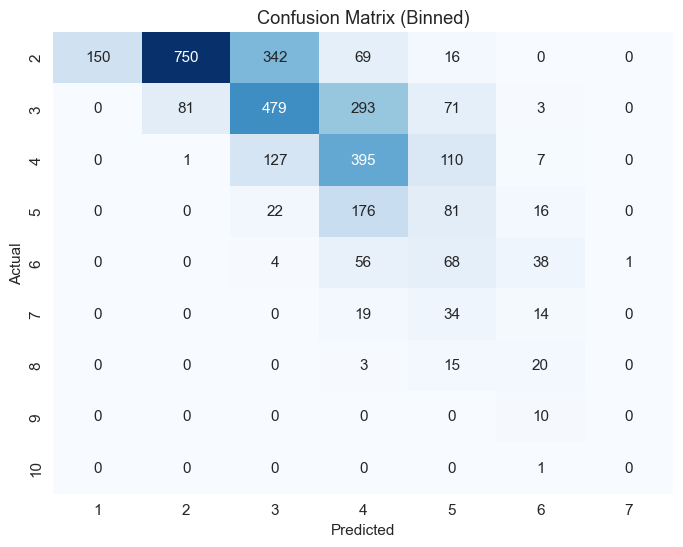

In [104]:
# Create bins for actual and predicted values
bins = np.linspace(min(y_test.min(), y_pred_LR.min()), max(y_test.max(), y_pred_LR.max()), 10)

# Bin the values
y_binned = np.digitize(y_test, bins)
pred_binned = np.digitize(y_pred_LR, bins)

# Create a confusion matrix (cross-tabulation) between actual and predicted bins
confusion_matrix = pd.crosstab(pd.Series(y_binned, name='Actual'),
                               pd.Series(pred_binned, name='Predicted'))

# Visualize the confusion matrix as a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(confusion_matrix, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix (Binned)')
plt.show()


#### Comparison between actual and predicted bike rental count

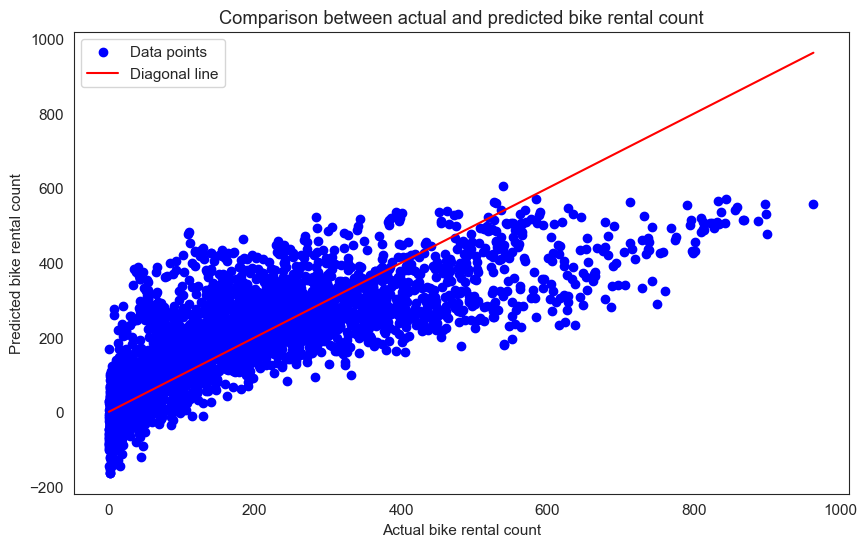

In [105]:
# Plot the comparison between the actual and predicted bike rental count
plt.figure(figsize=(10,6))
plt.scatter(y_test, y_pred_LR, color='blue', label='Data points')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', label='Diagonal line')
plt.xlabel('Actual bike rental count')
plt.ylabel('Predicted bike rental count')
plt.title('Comparison between actual and predicted bike rental count')
plt.legend()
plt.show()

### Ridge regression

In [106]:
from sklearn.linear_model import Ridge

In [107]:
# Create a pipeline object
pipe_ridge = Pipeline([
    ('scaler', StandardScaler()),
    ('ridge', Ridge())
    ])

param_ridge = {
    'ridge__alpha': [0.1, 1.0, 10.0],  # Example values for the alpha hyperparameter
    'ridge__solver': ['auto', 'svd', 'cholesky', 'lsqr', 'sparse_cg', 'sag', 'saga']  # Ridge solvers to try
    
     }

search_ridge = GridSearchCV(estimator=pipe_ridge,
                            param_grid=param_ridge,
                            cv=5,
                            return_train_score=True )

search_ridge.fit(X_train, y_train)

print(f" Best score is: {search_ridge.best_score_} with parameters: {search_ridge.best_params_}")

 Best score is: 0.6260104503439068 with parameters: {'ridge__alpha': 10.0, 'ridge__solver': 'saga'}


In [108]:
ridge=Ridge(alpha=0.1 , solver ='sag')

ridge.fit(X_train,y_train)

# Get the predict value from X_test
y_pred_ridge =ridge .predict(X_test)


In [109]:
# Evaluate the performance of the model
mse = metrics.mean_squared_error(y_test, y_pred_ridge)
r2 = metrics.r2_score(y_test, y_pred_ridge)
mae = metrics.mean_absolute_error(y_test, y_pred_ridge)
print(f'Mean Squared Error: {mse:.2f}')
print(f'R-squared Score: {r2:.2f}')
print(f'Mean Absolute Error: {mae:.2f}')

Mean Squared Error: 11773.45
R-squared Score: 0.61
Mean Absolute Error: 78.99


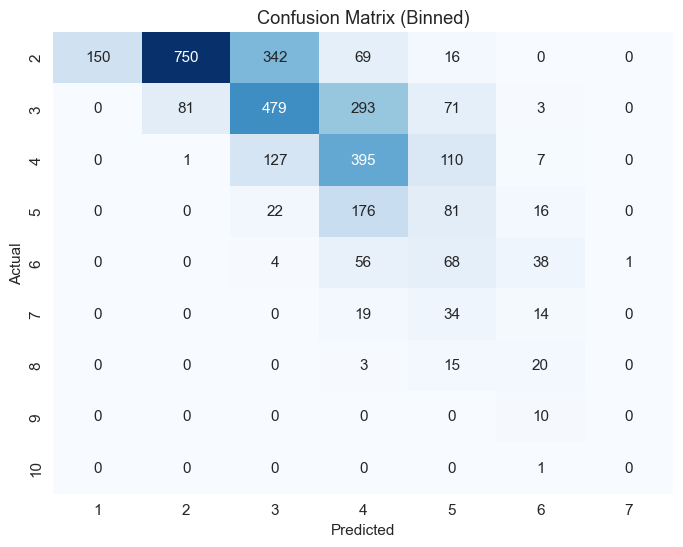

In [110]:

# Create bins for actual and predicted values
bins = np.linspace(min(y_test.min(), y_pred_ridge.min()), max(y_test.max(),y_pred_ridge.max()), 10)

# Bin the values
y_binned = np.digitize(y_test, bins)
pred_binned = np.digitize(y_pred_ridge, bins)

# Create a confusion matrix (cross-tabulation) between actual and predicted bins
confusion_matrix = pd.crosstab(pd.Series(y_binned, name='Actual'),
                               pd.Series(pred_binned, name='Predicted'))

# Visualize the confusion matrix as a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(confusion_matrix, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix (Binned)')
plt.show()

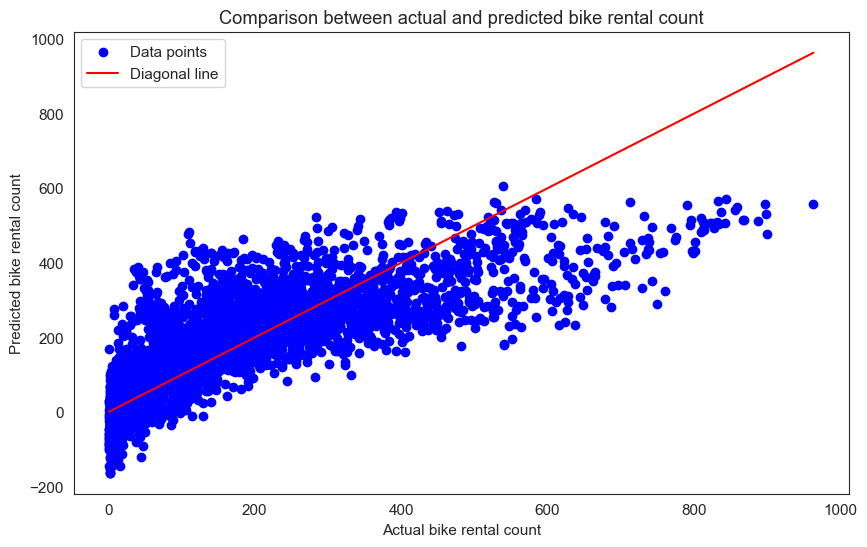

In [111]:
# Plot the comparison between the actual and predicted bike rental count
plt.figure(figsize=(10,6))
plt.scatter(y_test, y_pred_ridge, color='blue', label='Data points')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', label='Diagonal line')
plt.xlabel('Actual bike rental count')
plt.ylabel('Predicted bike rental count')
plt.title('Comparison between actual and predicted bike rental count')
plt.legend()
plt.show()

## Lasso Regression

In [112]:
from sklearn.linear_model import Lasso

In [113]:
# Create a pipeline with preprocessing and Lasso regression
pipe_lasso = Pipeline([
    ('scaler', StandardScaler()),  # Standardizing the features
    ('lasso', Lasso())  # Lasso regression model
    ])

# Define a parameter grid for GridSearchCV
param_lasso = {
    'lasso__alpha': [0.1, 1.0, 10.0],  
   
     }

search_lasso = GridSearchCV(estimator=pipe_lasso,
                            param_grid=param_lasso,
                            cv=5,
                            return_train_score=True )

search_lasso.fit(X_train, y_train)
print(f" Best score is: {search_lasso.best_score_} with parameters: {search_lasso.best_params_}")

 Best score is: 0.6259834003394956 with parameters: {'lasso__alpha': 0.1}


In [114]:
lasso=Lasso(alpha=0.1)

lasso.fit(X_train,y_train)

# Get the predict value from X_test
y_pred_lasso =lasso.predict(X_test)


In [115]:
# Evaluate the performance of the model
mse = metrics.mean_squared_error(y_test, y_pred_lasso)
r2 = metrics.r2_score(y_test, y_pred_lasso)
mae = metrics.mean_absolute_error(y_test, y_pred_lasso)
print(f'Mean Squared Error: {mse:.2f}')
print(f'R-squared Score: {r2:.2f}')
print(f'Mean Absolute Error: {mae:.2f}')

Mean Squared Error: 11771.88
R-squared Score: 0.61
Mean Absolute Error: 78.97


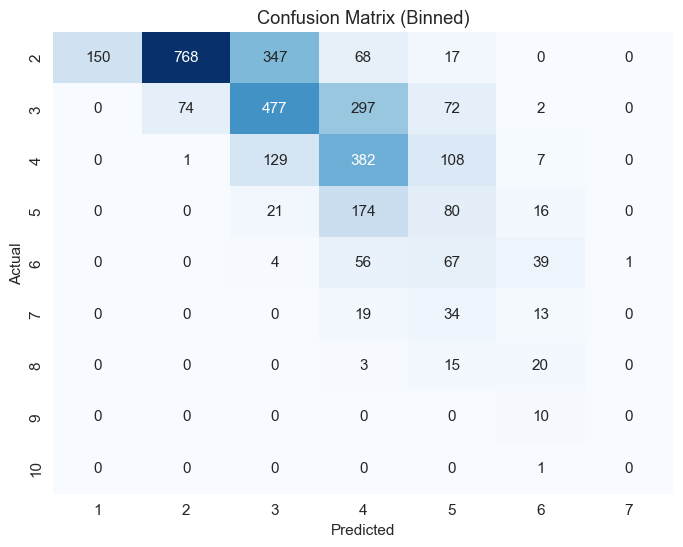

In [116]:

# Create bins for actual and predicted values
bins = np.linspace(min(y_test.min(), y_pred_lasso.min()), max(y_test.max(),y_pred_lasso.max()), 10)

# Bin the values
y_binned = np.digitize(y_test, bins)
pred_binned = np.digitize(y_pred_lasso, bins)

# Create a confusion matrix (cross-tabulation) between actual and predicted bins
confusion_matrix = pd.crosstab(pd.Series(y_binned, name='Actual'),
                               pd.Series(pred_binned, name='Predicted'))

# Visualize the confusion matrix as a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(confusion_matrix, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix (Binned)')
plt.show()

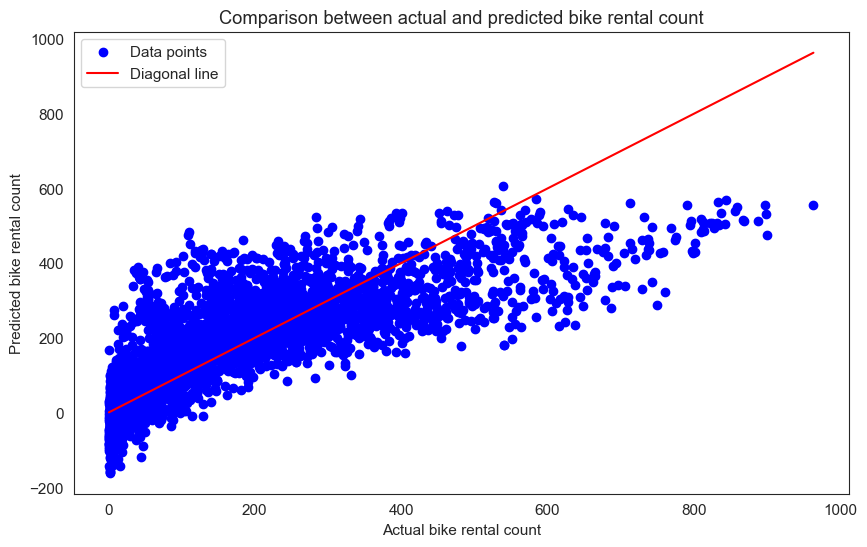

In [117]:
# Plot the comparison between the actual and predicted bike rental count
plt.figure(figsize=(10,6))
plt.scatter(y_test, y_pred_lasso, color='blue', label='Data points')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', label='Diagonal line')
plt.xlabel('Actual bike rental count')
plt.ylabel('Predicted bike rental count')
plt.title('Comparison between actual and predicted bike rental count')
plt.legend()
plt.show()

## DecisionTreeRegressor

In [118]:
from sklearn.tree import DecisionTreeRegressor

In [119]:
from sklearn.tree import DecisionTreeClassifier
import numpy as np

pipe_decsT = Pipeline([
    ('sc', StandardScaler()),
    ('decsT', DecisionTreeClassifier())
    ])

params_decsT = {
    'decsT__criterion' : ['gini', 'entropy'],
    'decsT__max_depth' : np.arange(3, 15)
    }

search_decsT = GridSearchCV(estimator=pipe_decsT,
                      param_grid=params_decsT,
                      cv = 5,
                      return_train_score=True)

search_decsT.fit(X_train, y_train)
print(f" Best score is: {search_decsT.best_score_} with parameters: {search_decsT.best_params_}")

 Best score is: 0.021462009362621534 with parameters: {'decsT__criterion': 'gini', 'decsT__max_depth': 10}


In [120]:
scores_decsT = search_decsT.cv_results_['mean_test_score']
criterion = ['gini', 'entropy']
DEPTH = np.arange(3, 15)
for idx, criterion in enumerate(criterion):
    for score, depth in (zip(scores_decsT[idx*len(DEPTH): (idx+1)*len(DEPTH)], DEPTH)):
        print(f"{depth, criterion}: {score:.10f}")

(3, 'gini'): 0.0154123154
(4, 'gini'): 0.0184371624
(5, 'gini'): 0.0186532229
(6, 'gini'): 0.0195894851
(7, 'gini'): 0.0198055456
(8, 'gini'): 0.0200936262
(9, 'gini'): 0.0209578682
(10, 'gini'): 0.0214620094
(11, 'gini'): 0.0211019085
(12, 'gini'): 0.0197335254
(13, 'gini'): 0.0203817069
(14, 'gini'): 0.0195894851
(3, 'entropy'): 0.0162765574
(4, 'entropy'): 0.0167086784
(5, 'entropy'): 0.0151962550
(6, 'entropy'): 0.0147641340
(7, 'entropy'): 0.0156283759
(8, 'entropy'): 0.0149801945
(9, 'entropy'): 0.0146921138
(10, 'entropy'): 0.0138998920
(11, 'entropy'): 0.0135397911
(12, 'entropy'): 0.0132517105
(13, 'entropy'): 0.0124594887
(14, 'entropy'): 0.0126755492


In [121]:
decsT=DecisionTreeClassifier()

decsT.fit(X_train,y_train)

# Get the predict value from X_test
y_pred_decsT =decsT.predict(X_test)

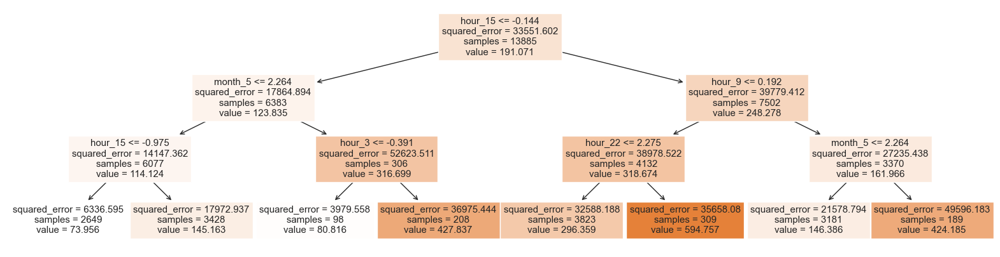

In [122]:
from sklearn import tree


target_col = "total_count"
use_cols = list(set(mydata_train.columns) - set([target_col]))
len(use_cols)

tree_reg = tree.DecisionTreeRegressor(max_depth=3)
tree_reg.fit(X_train, y_train)

fig = plt.figure(figsize=(20, 5))
tree.plot_tree(tree_reg, feature_names=use_cols, filled=True)
plt.show()

In [123]:
# Evaluate the performance of the model
mse = metrics.mean_squared_error(y_test, y_pred_decsT)
r2 = metrics.r2_score(y_test, y_pred_decsT)
mae = metrics.mean_absolute_error(y_test, y_pred_decsT)
print(f'Mean Squared Error: {mse:.2f}')
print(f'R-squared Score: {r2:.2f}')
print(f'Mean Absolute Error: {mae:.2f}')

Mean Squared Error: 12328.81
R-squared Score: 0.59
Mean Absolute Error: 70.04


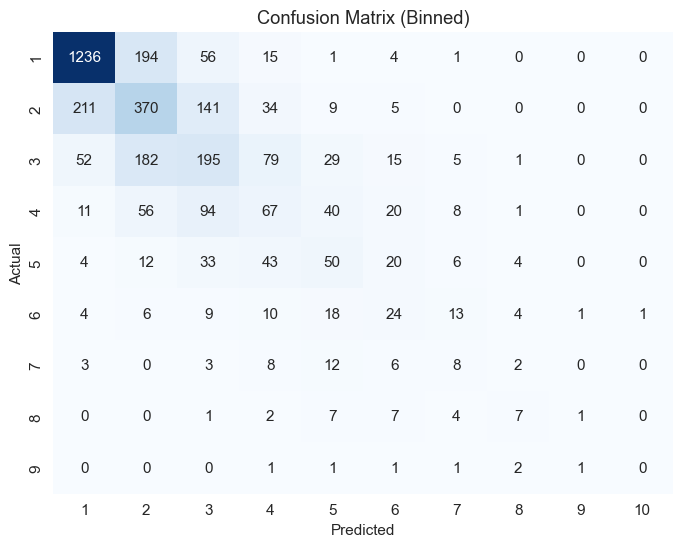

In [124]:
# Create bins for actual and predicted values
bins = np.linspace(min(y_test.min(), y_pred_decsT.min()), max(y_test.max(),y_pred_decsT.max()), 10)

# Bin the values
y_binned = np.digitize(y_test, bins)
pred_binned = np.digitize(y_pred_decsT, bins)

# Create a confusion matrix (cross-tabulation) between actual and predicted bins
confusion_matrix = pd.crosstab(pd.Series(y_binned, name='Actual'),
                               pd.Series(pred_binned, name='Predicted'))

# Visualize the confusion matrix as a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(confusion_matrix, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix (Binned)')
plt.show()

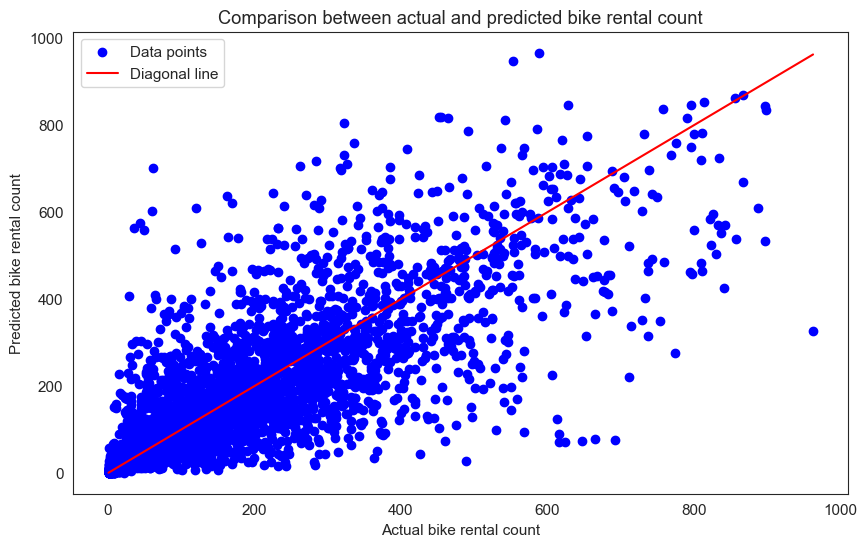

In [125]:
# Plot the comparison between the actual and predicted bike rental count
plt.figure(figsize=(10,6))
plt.scatter(y_test, y_pred_decsT, color='blue', label='Data points')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', label='Diagonal line')
plt.xlabel('Actual bike rental count')
plt.ylabel('Predicted bike rental count')
plt.title('Comparison between actual and predicted bike rental count')
plt.legend()
plt.show()

## KNeighborsClassifier

In [126]:
from sklearn.neighbors import KNeighborsClassifier


In [127]:
pipe_knn = Pipeline([
    ('sc', StandardScaler()),
    ('knn', KNeighborsClassifier())
    ])

params_knn = {
    'knn__n_neighbors': range(1, 20)
    }

search_knn = GridSearchCV(estimator=pipe_knn,
                      param_grid=params_knn,
                      cv = 5,
                      return_train_score=True)

search_knn.fit(X_train, y_train)
print(f" Best score is: {search_knn.best_score_} with parameters: {search_knn.best_params_}")

 Best score is: 0.024558876485415916 with parameters: {'knn__n_neighbors': 6}


In [128]:
knn = KNeighborsClassifier(n_neighbors = 6)
# Train the model
knn.fit(X_train, y_train)
# Get the predict value from X_test
y_pred_knn = knn.predict(X_test)

In [129]:
# Report
print(classification_report(y_pred_knn,y_test, digits = 3))
print('accuracy: ', metrics.accuracy_score(y_pred_knn, y_test))



    

              precision    recall  f1-score   support

           1      0.370     0.145     0.208        69
           2      0.304     0.133     0.185       105
           3      0.121     0.167     0.140        48
           4      0.127     0.119     0.123        59
           5      0.125     0.087     0.103        80
           6      0.152     0.106     0.125        66
           7      0.049     0.043     0.046        46
           8      0.053     0.062     0.057        32
           9      0.038     0.025     0.030        40
          10      0.000     0.000     0.000        32
          11      0.071     0.053     0.061        38
          12      0.000     0.000     0.000        27
          13      0.000     0.000     0.000        31
          14      0.167     0.167     0.167        18
          15      0.000     0.000     0.000        21
          16      0.000     0.000     0.000        18
          17      0.000     0.000     0.000        24
          18      0.056    

In [130]:
# Evaluate the performance of the model
mse = metrics.mean_squared_error(y_test, y_pred_knn)
r2 = metrics.r2_score(y_test, y_pred_knn)
mae = metrics.mean_absolute_error(y_test, y_pred_knn)

rmse = metrics.mean_squared_error(y_test, y_pred_knn, squared=False) 



print(f'Mean Squared Error: {mse:.2f}')
print(f'R-squared Score: {r2:.2f}')
print(f'Mean Absolute Error: {mae:.2f}')
print("Root Mean Squared Error:", rmse)

Mean Squared Error: 14243.31
R-squared Score: 0.53
Mean Absolute Error: 75.56
Root Mean Squared Error: 119.3453521342028


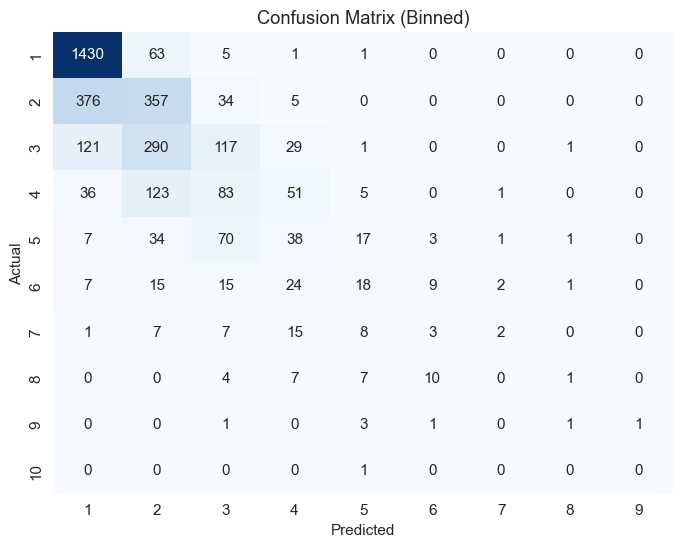

In [131]:
# Create bins for actual and predicted values
bins = np.linspace(min(y_test.min(), y_pred_knn.min()), max(y_test.max(), y_pred_knn.max()), 10)

# Bin the values
y_binned = np.digitize(y_test, bins)
pred_binned = np.digitize(y_pred_knn, bins)

# Create a confusion matrix (cross-tabulation) between actual and predicted bins
confusion_matrix = pd.crosstab(pd.Series(y_binned, name='Actual'),
                               pd.Series(pred_binned, name='Predicted'))

# Visualize the confusion matrix as a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(confusion_matrix, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix (Binned)')
plt.show()

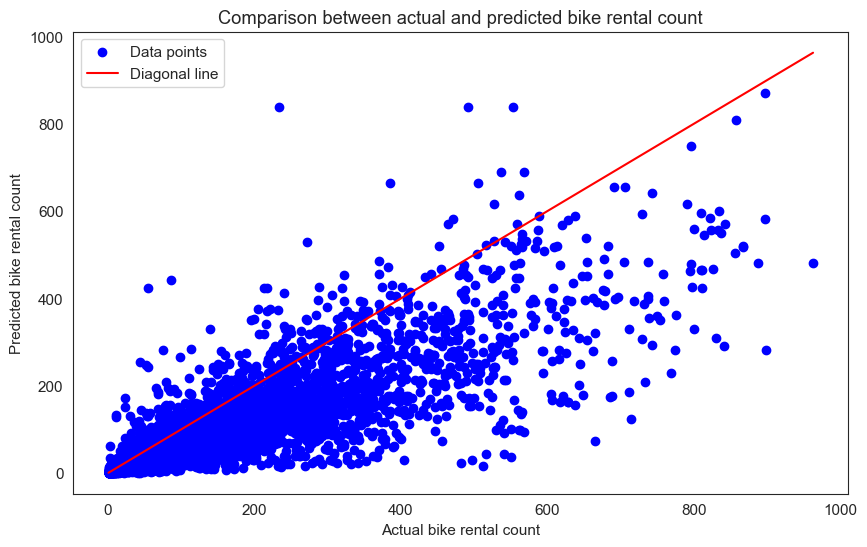

In [132]:
# Plot the comparison between the actual and predicted bike rental count
plt.figure(figsize=(10,6))
plt.scatter(y_test, y_pred_knn, color='blue', label='Data points')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', label='Diagonal line')
plt.xlabel('Actual bike rental count')
plt.ylabel('Predicted bike rental count')
plt.title('Comparison between actual and predicted bike rental count')
plt.legend()
plt.show()

## SVC

In [133]:
from sklearn.svm import SVC

In [134]:
# kernels = ['rbf', 'poly', 'sigmoid']
# C = np.logspace(-2, 10, 13)

# pipe_svm = Pipeline([
#    ('sc', StandardScaler()),
#    ('SVM', SVC())
#    ])

#params_svm = {'SVM__C': C,
#              'SVM__kernel': kernels,
#             }

#search_svm = GridSearchCV(estimator=pipe_svm,
#                      param_grid=params_svm,
#                      cv = 5,
#                      return_train_score=True)

# search_svm.fit(X_train, y_train)
# print(f" Best score is: {search_svm.best_score_} with parameters: {search_svm.best_params_}")


In [135]:
# svc = SVC()
# svc.fit(X_train,y_train)
# y_pred_svm = svc.predict(X_test)


In [136]:
# print(metrics.classification_report(y_pred_svm,y_test, digits = 3))
# print('accuracy: ', metrics.accuracy_score(y_pred_svm,y_test))


In [137]:
# Evaluate the performance of the model
# mse = metrics.mean_squared_error(y_test, y_pred_svm)
# r2 = metrics.r2_score(y_test, y_pred_svm)
# mae = metrics.mean_absolute_error(y_test,y_pred_svm)

# rmse = metrics.mean_squared_error(y_test,y_pred_svm, squared=False) 



# print(f'Mean Squared Error: {mse:.2f}')
# print(f'R-squared Score: {r2:.2f}')
# print(f'Mean Absolute Error: {mae:.2f}')
# print("Root Mean Squared Error:", rmse)

In [138]:
# Create bins for actual and predicted values
# bins = np.linspace(min(y_test.min(), y_pred_svm.min()), max(y_test.max(), y_pred_svm.max()), 10)

# Bin the values
# y_binned = np.digitize(y_test, bins)
# pred_binned = np.digitize(y_pred_svm, bins)

# Create a confusion matrix (cross-tabulation) between actual and predicted bins
# confusion_matrix = pd.crosstab(pd.Series(y_binned, name='Actual'),
#                              pd.Series(pred_binned, name='Predicted'))

# Visualize the confusion matrix as a heatmap
# plt.figure(figsize=(8, 6))
# sns.heatmap(confusion_matrix, annot=True, fmt='d', cmap='Blues', cbar=False)
# plt.xlabel('Predicted')
# plt.ylabel('Actual')
# plt.title('Confusion Matrix (Binned)')
# plt.show()

In [139]:
# Plot the comparison between the actual and predicted bike rental count
# plt.figure(figsize=(10,6))
# plt.scatter(y_test, y_pred_svm, color='blue', label='Data points')
# plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', label='Diagonal line')
# plt.xlabel('Actual bike rental count')
# plt.ylabel('Predicted bike rental count')
# plt.title('Comparison between actual and predicted bike rental count')
# plt.legend()
# plt.show()

## Random Forest Classifier

In [140]:
from sklearn.ensemble import RandomForestClassifier

In [141]:
# Create a Random Forest Classifier
rf_classifier = RandomForestClassifier(random_state=42)

# Define the parameter grid
param_rf = {
    "n_estimators": [10, 50, 100],
    "max_features": ["auto", "log2", "sqrt"],
    "bootstrap": [True, False]
}


# Create an instance of the GridSearchCV class
search_rf = GridSearchCV(estimator=rf_classifier,
                    param_grid=param_rf,
                    return_train_score=True,
                    cv=5)

search_rf.fit(X_train, y_train)
print(f" Best score is: {search_rf.best_score_} with parameters: {search_rf.best_params_}")


 Best score is: 0.023838674828952106 with parameters: {'bootstrap': True, 'max_features': 'sqrt', 'n_estimators': 50}


In [142]:
rf = RandomForestClassifier(bootstrap=True, n_estimators = 50)
# Train the model
rf.fit(X_train, y_train)
# Get the predict value from X_test
y_pred_rf = rf.predict(X_test)

In [143]:
# Evaluate the performance of the model
mse = metrics.mean_squared_error(y_test, y_pred_rf)
r2 = metrics.r2_score(y_test, y_pred_rf)
mae = metrics.mean_absolute_error(y_test,y_pred_rf)
rmse = metrics.mean_squared_error(y_test,y_pred_rf, squared=False) 



print(f'Mean Squared Error: {mse:.2f}')
print(f'R-squared Score: {r2:.2f}')
print(f'Mean Absolute Error: {mae:.2f}')
print("Root Mean Squared Error:", rmse)

Mean Squared Error: 10043.16
R-squared Score: 0.67
Mean Absolute Error: 63.13
Root Mean Squared Error: 100.21556977968683


In [144]:
print(metrics.classification_report(y_pred_rf,y_test, digits = 3))
print('accuracy: ', metrics.accuracy_score(y_pred_rf,y_test))


              precision    recall  f1-score   support

           1      0.222     0.136     0.169        44
           2      0.130     0.115     0.122        52
           3      0.152     0.192     0.169        52
           4      0.091     0.135     0.109        37
           5      0.071     0.080     0.075        50
           6      0.196     0.161     0.176        56
           7      0.073     0.079     0.076        38
           8      0.026     0.031     0.029        32
           9      0.038     0.033     0.036        30
          10      0.030     0.037     0.033        27
          11      0.071     0.069     0.070        29
          12      0.059     0.037     0.045        27
          13      0.000     0.000     0.000        19
          14      0.056     0.059     0.057        17
          15      0.000     0.000     0.000        15
          16      0.053     0.059     0.056        17
          17      0.000     0.000     0.000        29
          18      0.000    

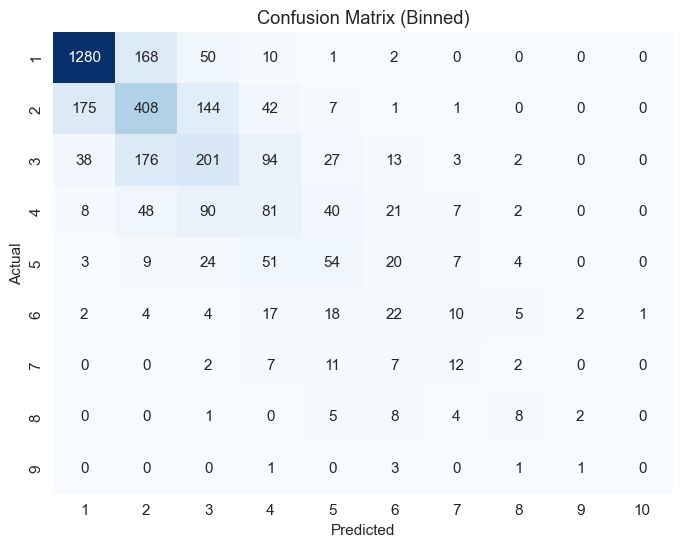

In [145]:
# Create bins for actual and predicted values
bins = np.linspace(min(y_test.min(), y_pred_rf.min()), max(y_test.max(), y_pred_rf.max()), 10)

# Bin the values
y_binned = np.digitize(y_test, bins)
pred_binned = np.digitize(y_pred_rf, bins)

# Create a confusion matrix (cross-tabulation) between actual and predicted bins
confusion_matrix = pd.crosstab(pd.Series(y_binned, name='Actual'),
                               pd.Series(pred_binned, name='Predicted'))

# Visualize the confusion matrix as a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(confusion_matrix, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix (Binned)')
plt.show()

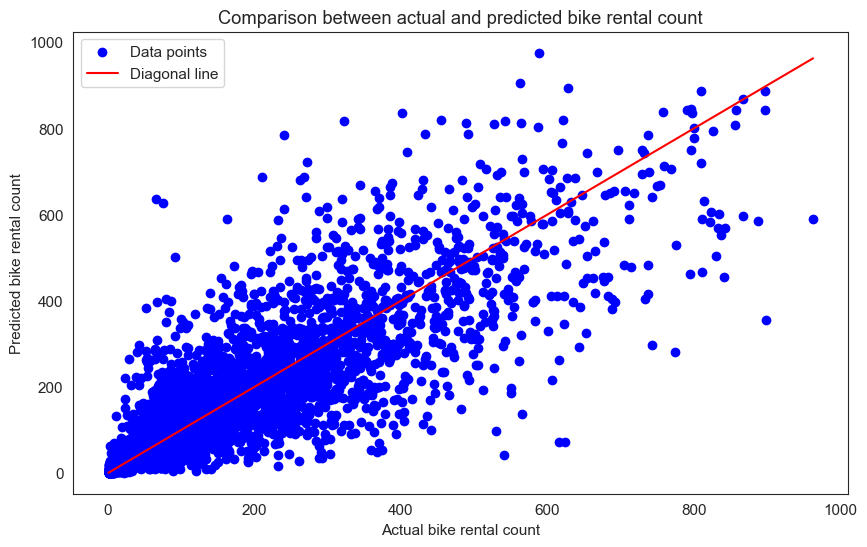

In [146]:
# Plot the comparison between the actual and predicted bike rental count
plt.figure(figsize=(10,6))
plt.scatter(y_test, y_pred_rf, color='blue', label='Data points')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', label='Diagonal line')
plt.xlabel('Actual bike rental count')
plt.ylabel('Predicted bike rental count')
plt.title('Comparison between actual and predicted bike rental count')
plt.legend()
plt.show()

## Model Comparison Report

In [147]:
# Evaluate the performance of the model
mse = metrics.mean_squared_error(y_test, y_pred_LR)
r2 = metrics.r2_score(y_test, y_pred_LR)
mae = metrics.mean_absolute_error(y_test, y_pred_LR)
rmse = metrics.mean_squared_error(y_test, y_pred_LR, squared=False) 
print(f'Mean Squared Error for Linear regression: {mse:.2f}')
print(f'R-squared Score for Linear regression: {r2:.2f}')
print(f'Mean Absolute Error for Linear regression: {mae:.2f}')
print("Root Mean Squared Error for Linear regression:", rmse)

# Evaluate the performance of the model
mse = metrics.mean_squared_error(y_test, y_pred_ridge)
r2 = metrics.r2_score(y_test, y_pred_ridge)
mae = metrics.mean_absolute_error(y_test, y_pred_ridge)
print(f'Mean Squared Error for Ridge regression: {mse:.2f}')
print(f'R-squared Score for Ridge regression: {r2:.2f}')
print(f'Mean Absolute Error for Ridge regression: {mae:.2f}')

# Evaluate the performance of the model
mse = metrics.mean_squared_error(y_test, y_pred_lasso)
r2 = metrics.r2_score(y_test, y_pred_lasso)
mae = metrics.mean_absolute_error(y_test, y_pred_lasso)
print(f'Mean Squared Error for lasso regression: {mse:.2f}')
print(f'R-squared Score for lasso regression: {r2:.2f}')
print(f'Mean Absolute Error for lasso regression: {mae:.2f}')

# Evaluate the performance of the model
mse = metrics.mean_squared_error(y_test, y_pred_decsT)
r2 = metrics.r2_score(y_test, y_pred_decsT)
mae = metrics.mean_absolute_error(y_test, y_pred_decsT)
print(f'Mean Squared Error for DecisionTreeRegressor: {mse:.2f}')
print(f'R-squared Score for DecisionTreeRegressor: {r2:.2f}')
print(f'Mean Absolute Error for DecisionTreeRegressor: {mae:.2f}')

# Evaluate the performance of the model
mse = metrics.mean_squared_error(y_test, y_pred_knn)
r2 = metrics.r2_score(y_test, y_pred_knn)
mae = metrics.mean_absolute_error(y_test, y_pred_knn)
rmse = metrics.mean_squared_error(y_test, y_pred_knn, squared=False) 
print(f'Mean Squared Error for knn: {mse:.2f}')
print(f'R-squared Score for knn: {r2:.2f}')
print(f'Mean Absolute Error for knn: {mae:.2f}')
print("Root Mean Squared Error for knn:", rmse)

# Evaluate the performance of the model
mse = metrics.mean_squared_error(y_test, y_pred_rf)
r2 = metrics.r2_score(y_test, y_pred_rf)
mae = metrics.mean_absolute_error(y_test,y_pred_rf)
rmse = metrics.mean_squared_error(y_test,y_pred_rf, squared=False) 
print(f'Mean Squared Error for Random Forest Regression: {mse:.2f}')
print(f'R-squared Score for Random Forest Regression: {r2:.2f}')
print(f'Mean Absolute Error for Random Forest Regression: {mae:.2f}')
print("Root Mean Squared Error for Random Forest Regression:", rmse)

Mean Squared Error for Linear regression: 11773.48
R-squared Score for Linear regression: 0.61
Mean Absolute Error for Linear regression: 78.99
Root Mean Squared Error for Linear regression: 108.50566341326433
Mean Squared Error for Ridge regression: 11773.45
R-squared Score for Ridge regression: 0.61
Mean Absolute Error for Ridge regression: 78.99
Mean Squared Error for lasso regression: 11771.88
R-squared Score for lasso regression: 0.61
Mean Absolute Error for lasso regression: 78.97
Mean Squared Error for DecisionTreeRegressor: 12328.81
R-squared Score for DecisionTreeRegressor: 0.59
Mean Absolute Error for DecisionTreeRegressor: 70.04
Mean Squared Error for knn: 14243.31
R-squared Score for knn: 0.53
Mean Absolute Error for knn: 75.56
Root Mean Squared Error for knn: 119.3453521342028
Mean Squared Error for Random Forest Regression: 10043.16
R-squared Score for Random Forest Regression: 0.67
Mean Absolute Error for Random Forest Regression: 63.13
Root Mean Squared Error for Random

In [148]:
from tabulate import tabulate
 
# assign data
mydata = [
    ["1- Linear Regression", "0.61"],
    ["2- Ridge regression", "0.61"],
    ["3- lasso regression", "0.61"],
    ["4- DecisionTreeRegressor", "0.59"],
    ["5- knn", "0.53"],
    ["6- Random Forest Regression","0.67"]
    
]
 
# create header
head = ["Model_Name", "R2_Score"]
 
# display table
print(tabulate(mydata, headers=head, tablefmt="grid"))

+-----------------------------+------------+
| Model_Name                  |   R2_Score |
+=============================+============+
| 1- Linear Regression        |       0.61 |
+-----------------------------+------------+
| 2- Ridge regression         |       0.61 |
+-----------------------------+------------+
| 3- lasso regression         |       0.61 |
+-----------------------------+------------+
| 4- DecisionTreeRegressor    |       0.59 |
+-----------------------------+------------+
| 5- knn                      |       0.53 |
+-----------------------------+------------+
| 6- Random Forest Regression |       0.67 |
+-----------------------------+------------+


### Final Model for bike rental count

Observation:

When we compare the root mean squared error and mean absolute error for multipple models, the random forest model has less root mean squared error and mean absolute error.Also the accuracy according to r2score is also high for RandomForest. So, finally random forest model is bset for predicting the bike rental count on daily basis.

## Conclusion

Predicting bike rental based on environment and seasons deals with the real-life problems that is were the bikes are going to be unused and kept as waste in the docking stations. In this, we predicted the total number of users that are going to be registered by taking the data of one docking station. We have used the regression techniques to solve the issue of unusage of the bike that are present in the docking stations. By using this regression technique, we got the accurate prediction of the users that are going to be registered in the future. In this model, we eliminated the duplicate data and the unwanted data, we cleaned the data, and we used this cleaned data as data points by collecting all these data points, and got a prediction line

We fitted Linear regression, Decision Tree and Random forest model,Rigid regression,KNeighborsRegressor,Support Vector Regression,Lasso Regression and find the accuracy with and without cross validation and find out that accuracy of RandomForest is high and thus used this model for the prediction of bike rental counts



## Challenges


Below are few limitations in this analysis and ideas to improve model prediction accuracy
* Since casual + registered = total count, we just predicted the total bike rental count by ignoring the casual and registered user information. Another (possibly better) method would be to train separate models for casual and registered users and add the two
* One limitation in the provided training data set is that it lacked data with extreme weather condition data (weather = 4). Hence we had to modify it to weather = 3
* Windspeed wasnt used due to very low correlation. This might have been due to several instances where windspeed = 0. One possible method could be to first estimate those windspeed and then use it as a feature to estimate count. 

# Bhartendu Shekher - bhartendushekher@gmail.com